#  Case Study 4 Solution

### Problem Statement

We are going to apply for a new job to expand our data science career. However, the early draft of our resume is rough and incomplete, which may not yet represent some vital data science skills. Therefore, we would like to find those missing skills by analyzing the data searched from a popular job-search site. Additionally, the site's search engine can match jobs to uploaded documents. Hence, we searched on the first 15 listed sections of the table of contents of the book 'Data Science Bookcamp'. 

After we upload the file with the listed sections to the job-search site, thousands of job postings are returned. We aim to extract common data science skills from the downloaded data. Then, we will compare these skills to our resume to determine which skills need to be added.

### Approaches To The Problem

To reach our goal, we will proceed like this:

1. Parse out all the text from the downloaded HTML files.

2. Explore the parsed output to learn how job skills are commonly described in online postings. Perhaps specific HTML tags are more commonly used to underscore job skills.

3. Try to filter out any irrelevant job postings from our dataset. The search engine isn’t perfect. Perhaps some irrelevant postings were erroneously downloaded. We can evaluate relevance by comparing the postings with our resume and the table of contents.

4. Cluster the job skills within the relevant postings, and visualize the clusters.

5. Compare the clustered skills to our resume content. We’ll then make plans to update our resume with any missing data science skills

## 1. Extracting Skill Requirements from Job Posting Data

We'll begin by loading all the HTML files in the `job_postings` directory.

**Listing 1. 1. Loading HTML files**

In [1]:
import warnings
warnings.filterwarnings('ignore')###There is warnings for new python updates.
import glob ###use glob module to obtain files in the local computer environment.
html_contents = []  ### create empty set to the stored files.

for file_name in sorted(glob.glob('/Users/georgeli/Desktop/stat3011/bookcamp_code/Case_Study4/job_postings/*.html')):
    with open(file_name, 'r') as f:
        html_contents.append(f.read())     ###copy local path in glob('path/*.html') to search the specific types 
        ###of files then use for loop to open each files to store into html_content.
        
print(f"We've loaded {len(html_contents)} HTML files.") ###print the total numbers of files that store into the new files.

We've loaded 1458 HTML files.


We've loaded 1458 HTML files into `html_contents`. Each HTML file can be parsed using Beautiful Soup. 

**Listing 1. 2. Parsing HTML files**

In [2]:
from bs4 import BeautifulSoup as bs

soup_objects = [] ###create empty set to store the parsed html files.
for html in html_contents: ###use for loop to each html_contents, define each files contains title and body.
    soup = bs(html)
    assert soup.title is not None  ###define title is existed.
    assert soup.body is not None ###define content body is existed.
    soup_objects.append(soup)   ### insert single element into soup.

Each parsed HTML file contains a title and a body.  Are there any duplicates across the titles or bodies of these files? We can find out by using Pandas.

**Listing 1. 3. Checking title and body texts for duplicates**

In [3]:
import pandas as pd  ###use panda describe function to find out the duplicates of the text.
html_dict = {'Title': [], 'Body': []}  ### create target empty sets.

for soup in soup_objects:
    title = soup.find('title').text  ### define title as title in soup sets.
    body = soup.find('body').text    ### define body as body in soup sets.
    html_dict['Title'].append(title) ### insert each title elements into html_dict's Title set by for loop and append modules.
    html_dict['Body'].append(body) ### insert each body elements into html_dict's Body set by for loop and append modules.
    
df_jobs = pd.DataFrame(html_dict) ### make html_dict becomes two dimentional array data.
summary = df_jobs.describe()   ### use describe function to find out the duplicates of any titles and body.
print(summary)  ###print the summary.

                                Title  \
count                            1458   
unique                           1364   
top     Data Scientist - New York, NY   
freq                               13   

                                                     Body  
count                                                1458  
unique                                               1458  
top     Data Scientist - Beavercreek, OH\nData Scienti...  
freq                                                    1  


From the results, although it is found that 94 titles are not unique and the same title appears 13 times at most, it is common that jobs titles are same and it can be ignored. Fortunately, there are not any duplicates for body parts. 
We need to remove the duplicate job posting if there is any same body part within our data.
<br>We’ve confirmed that no duplicates are present within the html. Now, lets explore the HTML content in more detail. The goal of our exploration will be to determine how job-skills are described in the HTML.

### 2. Exploring the HTML for Skill Descriptions

We’ll start our exploration by rendering the HTML at index of 0 of `html_contents`.

**Listing 2. 1. Rendering the HTML of the first job-posting**

In [4]:
from IPython.core.display import display, HTML     ###use display module to obtain the content of html data.
assert len(set(html_contents)) == len(html_contents) ### review the content in the orignal way.
display(HTML(html_contents[0])) ### display the first job posting.

We can subdivide `html_contents[0]` into 2 conceptually-different parts:

.. An initial job summary.
.. A list of bulleted skills required to get the job.

Is the next job posting structured in a similar manner? Lets find out, by rendering `html_contents[1]`.

**Listing 2. 2. Rendering the HTML of the second job-posting**

In [5]:
display(HTML(html_contents[1])) ###display the second job posting to make sure there are similar structures in job postings.

The bullet-points in `html_contents[0]` and `html_contents[1]` serve a singular purpose. They offer us brief, sentence-length descriptions of unique skills required for each position.

Do these types of bulleted skill descriptions appear in other job posts? We’ll now find out. First, we’ll extract the bullets from each of our parsed html files. 

**Listing 2. 3. Extracting bullets from the HTML**

In [6]:
df_jobs['Bullets'] = [[bullet.text.strip() ### strip the line break from each bullet to avoid printing the line breaks
                                        ### in the later investigation.
                      for bullet in soup.find_all('li')] #### find out the content start with bullet point by the "li"
                      for soup in soup_objects]     ### text type.

What percentage of job postings actually contain bulleted text? We need to find out! If that percentage is too low, then further bullet-analysis is not worth our time.

**Listing 2. 4. Measuring the percent of bulleted postings**

In [7]:
bulleted_post_count = 0  ##define bulleted post count as 0
for bullet_list in df_jobs.Bullets:  ### use for loop to count the bulleted post
    if bullet_list:
        bulleted_post_count += 1
            
percent_bulleted = 100 * bulleted_post_count / df_jobs.shape[0]  ###total of bullted post counts divides
                                                                ###total numbers of job postings.
print(f"{percent_bulleted:.2f}% of the postings contain bullets") ### print the percentages of bulleted posts.

90.53% of the postings contain bullets


90% of the job postings contain bullets. Do all (or most) of these bullets focus on skills? We better gage the contents of the bullet-points by printing the top-ranked words within their texts. Below, we'll we rank the words using summed TFDIF values. 

**Listing 3. 1. Examining the top-ranked words in the HTML bullet**

In [8]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer ### use TFIDF matrix to rank the frequencies of words.

def rank_words(text_list): ### define the rank euqation.
    vectorizer = TfidfVectorizer(stop_words='english') ### use TFIDF to detect English words.
    tfidf_matrix = vectorizer.fit_transform(text_list).toarray() ### vectorize the text list and make it becomes a matrix
    df = pd.DataFrame({'Words': vectorizer.get_feature_names(),
                       'Summed TFIDF': tfidf_matrix.sum(axis=0)}) ### compute TFIDF matrix and sum across the rows of the matrix.
    sorted_df = df.sort_values('Summed TFIDF', ascending=False) ### sort the summed TFIDF in decending way.
    return sorted_df  

all_bullets = []  ### create the empty set for the bullet words.
for bullet_list in df_jobs.Bullets:
    all_bullets.extend(bullet_list)  ### appends the elements to the end of the current list.

sorted_df = rank_words(all_bullets) ### use the rank function which define previously to rank the all_bullets.
print(sorted_df[:5].to_string(index=False)) ### print out the first five highest frequencies word base on summed TFIDF.
###return a sorted pandas table of top-ranked words.

     Words  Summed TFIDF
experience    878.030398
      data    842.978780
    skills    440.780236
      work    371.684232
   ability    370.969638


Terms such as _skills_ and _ability_ appear among the top 5 bulleted words. How do these bulleted words compare to the remaining words in each job posting? Lets find out. 

**Listing 3. 2. Examining the top-ranked words in the HTML bodies**

In [9]:
non_bullets = [] ###crete an empty set for non_bullets body.
for soup in soup_objects:
    body = soup.body
    for tag in body.find_all('li'):  ### find out all bulleted lists in body part
        tag.decompose()  ###remove any bulleted lists by decompose function
        ### or we can use body.find_all('ul') to get the same result, ul represents unordered(unbulleted) list.
        
    non_bullets.append(body.text)### store the non-bulleted list into body.text.
    
sorted_df = rank_words(non_bullets) ### use previous summed TFIDF to rank the words.
print(sorted_df[:5].to_string(index=False)) ### print the top-rank table.

     Words  Summed TFIDF
      data     99.111312
      team     39.175041
      work     38.928948
experience     36.820836
  business     36.140488


The words _skills_ and _ability_ are no longer present in the ranked output.  Thus, the non-bulleted text appears to be less skill-oriented than the bullet contents.

Strangely, the words _scientist_ and _science_ is missing from the list. Perhaps some posts pertain to data-driven jobs which aren't directly data science jobs? Lets actively explore this possibility. 

**Listing 4. 1. Checking titles for references to data science positions**

In [10]:
regex = r'Data Scien(ce|tist)' ###define key word 
df_non_ds_jobs = df_jobs[~df_jobs.Title.str.contains(regex, case=False)] ### define irrelevant jobs by ~regex.

percent_non_ds = 100 * df_non_ds_jobs.shape[0] / df_jobs.shape[0]   ###count the irrelevant jobs percentage.
print(f"{percent_non_ds:.2f}% of the job posting titles do not mention a "
       "data science position. Below is a sample of such titles:\n") ### print the result.

for title in df_non_ds_jobs.Title[:10]: 
    print(title)  ###print out the first ten irrelevant job titles to check the post title contents.

64.33% of the job posting titles do not mention a data science position. Below is a sample of such titles:

Patient Care Assistant / PCA - Med/Surg (Fayette, AL) - Fayette, AL
Data Manager / Analyst - Oakland, CA
Scientific Programmer - Berkeley, CA
JD Digits - AI Lab Research Intern - Mountain View, CA
Operations and Technology Summer 2020 Internship-West Coast - Universal City, CA
Data and Reporting Analyst - Olympia, WA 98501
Senior Manager Advanced Analytics - Walmart Media Group - San Bruno, CA
Data Specialist, Product Support Operations - Sunnyvale, CA
Deep Learning Engineer - Westlake, TX
Research Intern, 2020 - San Francisco, CA 94105


Theirst posting on the list is for a _Patient Care Assistant_ or _PCA_. The erroneous posting contains skills that we both lack and also have no interest in obtaining.

**Listing 4. 2. Sampling bullets from a non-data science job**

In [11]:
bullets = df_non_ds_jobs.Bullets.iloc[0] ###get the first non-data science job.
for i, bullet in enumerate(bullets[:5]):
     print(f"{i}: {bullet.strip()}") ### print out first five bullet points of the first non-data science job.

0: Provides all personal care services in accordance with the plan of treatment assigned by the registered nurse
1: Accurately documents care provided
2: Applies safety principles and proper body mechanics to the performance of specific techniques of personal and supportive care, such as ambulation of patients, transferring patients, assisting with normal range of motions and positioning
3: Participates in economical utilization of supplies and ensures that equipment and nursing units are maintained in a clean, safe manner
4: Routinely follows and adheres to all policies and procedures


We need to leverage text similarity in order to filter out those jobs that do not align with our resume content. 
Lets proceed to filter the jobs by relevance.

## 5. Filtering Jobs by Relevance

Our goal is to evaluate job relevance using text similarity. We'll want to compare the text within each posting to our resume and/or book table-of-contents. In preparation, lets now store our resume within a `resume` string.

**Listing 5. 1. Loading the resume**

In [12]:
resume = open('resume.txt', 'r').read() ###open the resume use open(.read()) function.
print(resume) 

Experience

1. Developed probability simulations using NumPy.
2. Assessed online ad-clicks for statistical significance using Permutation testing.
3. Analyzed disease outbreaks using common clustering algorithms.

Additional Skills

1. Data visualization using Matplotlib.
2. Statistical analysis using SciPy.
3. Processing structured tables using Pandas.
4. Executing K-Means clustering and DBSCAN clustering using Scikit-Learn.
5. Extracting locations from text using GeonamesCache.
6. Location analysis and visualization using GeonamesCache and Basemap.
7. Dimensionality reduction with PCA and SVD, using Scikit-Learn.
8. NLP analysis and text topic detection using Scikit-Learn.


In this same manner, we can store the table of contents within a `table_of_contents` string.

**Listing 5. 2. Loading the table-of-content**

In [13]:
table_of_contents = open('table_of_contents.txt', 'r').read() ###open the table_of_content.

Together, `resume` and `table_of_contents` summarize our existing skill-set. Lets concatenate these skills into a single `existing_skills` string.

**Listing  5. 3. Combining skills into a single string**

In [14]:
existing_skills = resume + table_of_contents  ### combine the resume and table of contents words together.

We want to compute all similarities between `df_jobs.Body` and `existing_skills.` This computation first requires that we vectorize all texts. 

**Listing 5. 4. Vectorizing our skills and the job-posting data**

In [15]:
text_list = df_jobs.Body.values.tolist() + [existing_skills] ###combine the skills data and job postings data.
vectorizer = TfidfVectorizer(stop_words='english')   ###define vectorizer using TfidfVectorize and only detect English words.
tfidf_matrix = vectorizer.fit_transform(text_list).toarray() ###make the new data sets into matrix format.

Our vectorized texts are stored in a matrix format within `tfidf_matrix`. The final matrix row (`tfidf_matrix[-1]`) corresponds to our existing skill-set. Thus, we can easily compute the cosine similarities between the job postings and `existing_skills`, by running `tfdf_matrix[:-1] @ tfidf_matrix[-1]`. 

**Listing 5. 5. Computing skill-based cosine similarities**

In [16]:
cosine_similarities = tfidf_matrix[:-1] @ tfidf_matrix[-1] ###capture the text overlap between existing skills and the posted jobs.

We can leverage `cosine_similarities` to rank to the jobs by relevance. Lets proceed to carry out the ranking. Afterwards, we'll confirm if the 20 least-relevant jobs have anything to do with data science.

**isting 5. 6. Printing the 20 least-relevant jobs**

In [17]:
df_jobs['Relevance'] = cosine_similarities ###define the relevance by using cosine_similarities.
sorted_df_jobs = df_jobs.sort_values('Relevance', ascending=False) ###sort the job titles by relevance.
for title in sorted_df_jobs[-20:].Title: ### print our 20 the least relevant jobs.
    print(title)

Data Analyst Internship (8 month minimum) - San Francisco, CA
Leadership and Advocacy Coordinator - Oakland, CA 94607
Finance Consultant - Audi Palo Alto - Palo Alto, CA
RN - Hattiesburg, MS
Configuration Management Specialist - Dahlgren, VA
Deal Desk Analyst - Mountain View, CA
Dev Ops Engineer AWS - Rockville, MD
Web Development Teaching Assistant - UC Berkeley (Berkeley) - Berkeley, CA
Scorekeeper - Oakland, CA 94612
Direct Care - All Experience Levels (CNA, HHA, PCA Welcome) - Norwell, MA 02061
Director of Marketing - Cambridge, MA
Certified Strength and Conditioning Specialist - United States
PCA - PCU Full Time - Festus, MO 63028
Performance Improvement Consultant - Los Angeles, CA
Patient Services Rep II - Oakland, CA
Lab Researcher I - Richmond, CA
Part-time instructor of Statistics for Data Science and Machine Learning - San Francisco, CA 94105
Plant Engineering Specialist - San Pablo, CA
Page Not Found - Indeed Mobile
Director of Econometric Modeling - External Careers


Almost all the printed jobs are completely irrelevant! Now, for comparison’s sake, lets print the 20 most-relevant job titles in `sorted_ds_jobs`.

**Listing 5. 7. Printing the 20 most-relevant jobs**

In [18]:
for title in sorted_df_jobs[:20].Title: ### find out the top-20 relevant job in sorted list then print it out.
    print(title)

Chief Data Officer - Culver City, CA 90230
Data Scientist - Beavercreek, OH
Data Scientist Population Health - Los Angeles, CA 90059
Data Scientist - San Diego, CA
Data Scientist - Beavercreek, OH
Senior Data Scientist - New York, NY 10018
Data Architect - Raleigh, NC 27609
Data Scientist (PhD) - Spring, TX
Data Science Analyst - Chicago, IL 60612
Associate Data Scientist (BS / MS) - Spring, TX
Data Scientist - Streetsboro, OH 44241
Data Scientist - Los Angeles, CA
Sr Director of Data Science - Elkridge, MD
2019-57 Sr. Data Scientist - Reston, VA 20191
Data Scientist (PhD) - Intern - Spring, TX
Sr Data Scientist. - Alpharetta, GA 30004
Data Scientist GS 13/14 - Clarksburg, WV 26301
Data Science Intern (BS / MS) - Intern - Spring, TX
Senior Data Scientist - New York, NY 10038
Data Scientist - United States


Whenv`df_jobs.Relevance` is high, the associated job postings are relevant. As `df_jobs.Relevance` decreases, the associated jobs become less relevant. Thus, we can presume that there exists some `df_jobs.Relevance` cutoff, which separates the relevant jobs from the non-relevant jobs. Lets try to identify that cutoff. by visualizing the shape of the sorted relevance distribution.

**Listing 5. 8. Plotting job-ranking vs relevance**

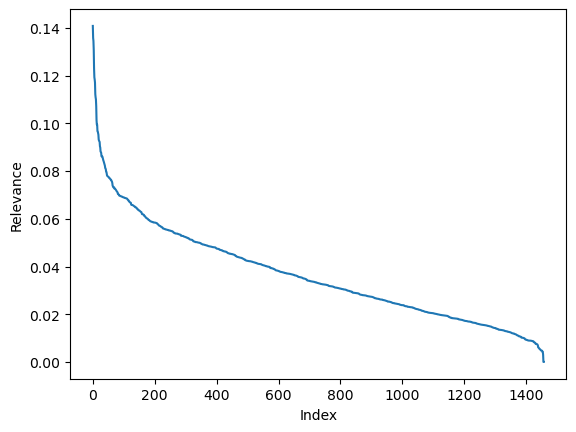

In [19]:
import matplotlib.pyplot as plt 
plt.plot(range(df_jobs.shape[0]), sorted_df_jobs.Relevance.values) ###plot the relevance vs numbers of jobs.
plt.xlabel('Index') ### add the x-label.
plt.ylabel('Relevance') ###add the y-label.
plt.show() ###plot the graph.

Our relevance curve resembles a K-means Elbow plot. Initially, the relevance drops rapidly. Then, at an x-value of approximately 60, the curve begins to level off. Lets emphasize this transition by striking a vertical line through the x-position of 60 in our plot.

**Listing 5. 9. Adding a cutoff to the relevance plot**

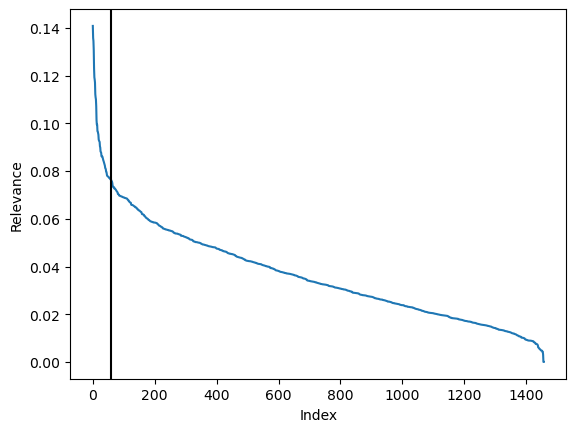

In [20]:
plt.plot(range(df_jobs.shape[0]), sorted_df_jobs.Relevance.values)
plt.xlabel('Index')
plt.ylabel('Relevance')
plt.axvline(60, c='k') ###add vertical line x=60.
plt.show()

Our plot implies that the first 60 jobs are noticeably more relevant than all subsequent jobs. Based on our hypothesis, jobs 40 - 60 should be highly relevant.

**Listing 5. 10. Printing jobs below the relevance cutoff**

In [21]:
for title in sorted_df_jobs[40: 60].Title.values:
    print(title) ###print postings title between fortieth and sixtieth posts.

Data Scientist III - Pasadena, CA 91101
Global Data Engineer - Boston, MA
Data Analyst and Data Scientist - Summit, NJ
Data Scientist - Generalist - Glendale, CA
Data Scientist - Seattle, WA
IT Data Scientist - Contract - Riverton, UT
Data Scientist (Analytic Consultant 4) - San Francisco, CA
Data Scientist - Seattle, WA
Data Science & Tagging Analyst - Bethesda, MD 20814
Data Scientist - New York, NY
Senior Data Scientist - Los Angeles, CA
Principal Statistician - Los Angeles, CA
Senior Data Analyst - Los Angeles, CA
Data Scientist - Aliso Viejo, CA 92656
Data Engineer - Seattle, WA
Data Scientist - Digital Factory - Tampa, FL 33607
Data Scientist - Grapevine, TX 76051
Data Scientist - Bioinformatics - Denver, CO 80221
EPIDEMIOLOGIST - Los Angeles, CA
Data Scientist - Bellevue, WA


Almost all the printed jobs are are highly relevant. Implicity, the relevance should decrease when we print the next 20 job-titles, since they lie beyond the bounds of index 60. Lets verify if this is the case.

**Listing 5. 11. Printing jobs beyond the relevance cutoff**

In [22]:
for title in sorted_df_jobs[60: 80].Title.values:
    print(title)###print postings title between sixtieth and eightieth posts.

Data Scientist - Aliso Viejo, CA
Data Scientist and Visualization Specialist - Santa Clara Valley, CA 95014
Data Scientist - Los Angeles, CA
Data Scientist Manager - NEW YORK LOCATION! - New York, NY 10036
Data Science Intern - San Francisco, CA 94105
Research Data Analyst - San Francisco, CA
Sr Data Scientist (Analytic Consultant 5) - San Francisco, CA
Data Scientist, Media Manipulation - Cambridge, MA
Manager, Data Science, Programming and Visualization - Boston, MA
Data Scientist in Broomfield, CO - Broomfield, CO
Senior Data Scientist - Executive Projects and New Solutions - Foster City, CA
Manager of Data Science - Burbank California - Burbank, CA
Data Scientist Manager - Hiring in Burbank! - Burbank, CA
Data Scientists needed in NY - Senior Consultants and Managers! - New York, NY 10036
Data Scientist - Menlo Park, CA
Data Engineer - Santa Clara, CA
Data Scientist - Remote
Data Scientist I-III - Phoenix, AZ 85021
SWE Data Scientist - Santa Clara Valley, CA 95014
Health Science Sp

A majority of the printed jobs refer to data science / analyst roles, outside the scope of health science or management. We can quickly quantify this observation using regular expressions. Below, we’ll define a `percent_relevant_tiles` function, which returns the percent of non-management data science and analysis jobs within a data frame slice.

**Listing 5. 12. Measuring title relevance in a subset of jobs**

In [23]:
import re ###re provides regular expression matching operations.
def percent_relevant_titles(df):
    regex_relevant = re.compile(r'Data (Scien|Analy)', ###use re function to define the relevant by contain key words
                                flags=re.IGNORECASE)   ### such as Data Scien or Data Analy.
    regex_irrelevant = re.compile(r'\b(Manage)',        ### use re function to define the irrelevant by contain key word
                                  flags=re.IGNORECASE) ### xxxx mangae.
    match_count = len([title for title in df.Title     ### use for loop to match each post titles.
                       if regex_relevant.search(title)  ### define count rule if it belongs regex_relevant and not regex
                       and not regex_irrelevant.search(title)]) #### _irrelevant, calculate the frequency of specific post titles.
    percent = 100 * match_count / df.shape[0] ### calculate the percentage.
    return percent

percent = percent_relevant_titles(sorted_df_jobs[60: 80])### count the relevant percentage between 60th and 80th post titles.
print(f"Approximately {percent:.2f}% of job titles between indices " ### make the percentage to round up to two decimal place then
       "60 - 80 are relevant")   ### pirnt it out.

Approximately 65.00% of job titles between indices 60 - 80 are relevant


Approximately 65% of the job-titles in `sorted_df_jobs[60: 80]` are relevant. Perhaps that percentage will drop if we sample the next 20 jobs, across an index range of 80 - 100. 

**Listing 5. 13. Measuring title relevance in the next subset of jobs**

In [24]:
percent = percent_relevant_titles(sorted_df_jobs[80: 100])### count the relevant percentage between 80th and 100th post titles.
print(f"Approximately {percent:.2f}% of job titles between indices "
       "80 - 100 are relevant") ###print the result in two decimal place.

Approximately 80.00% of job titles between indices 80 - 100 are relevant


Nope! The data science title-percentage rose to 80%. At what point will the percentage drop below 50%? We can easily find out, using a plot.

**Listing 5. 14. Plotting percent relevance across all title samples**

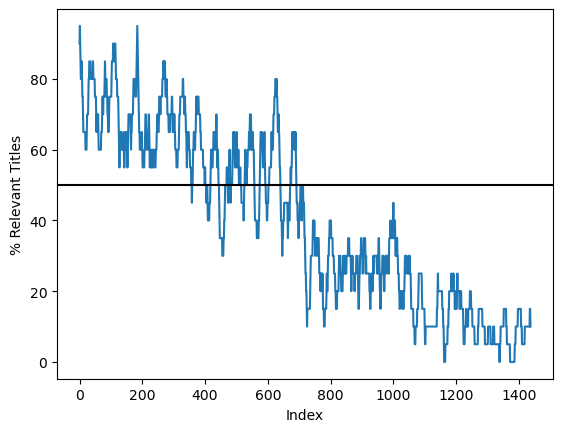

In [25]:
def relevant_title_plot(index_range=20): ###define the range parameter for each 20 posts.
    percentages = []
    start_indices = range(df_jobs.shape[0] - index_range) ### start the range from 0 and total posting count minus the
    for i in start_indices:                              ###  index_range(20).
        df_slice = sorted_df_jobs[i: i + index_range]### start at 0 to 20, 20 to 40 ... posts.
        percent = percent_relevant_titles(df_slice) ### percentage of relevant posts in each intervals.
        percentages.append(percent)   ### store the percentage of each intervals into the percent data set.

    plt.plot(start_indices, percentages) 
    plt.axhline(50, c='k')  ###add the horizontal line y=50, it means that we only consider the job posts with
    plt.xlabel('Index')    ### 50% relevant or above.
    plt.ylabel('% Relevant Titles') ### add x-label and y-label to the plot.

relevant_title_plot()
plt.show()  ###print the graph.

The relevant Data Science titles drop below 50% at an index of around 700. Of course, its possible that the cutoff of 700 is merely an artifact of our chosen index range. Will the cutoff still be present if double our index range? Lets find out.

**Listing 5. 15. Plotting percent relevance across an increased index-range**

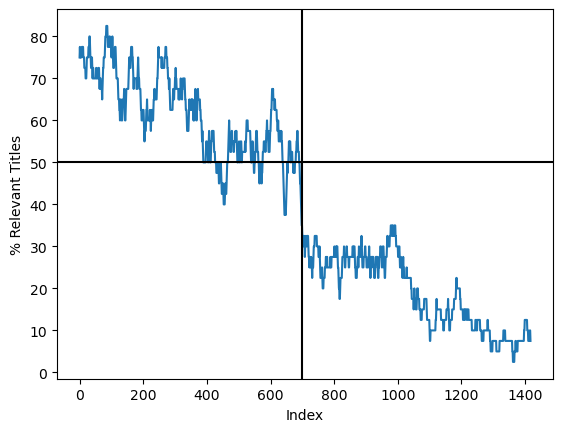

In [26]:
relevant_title_plot(index_range=40)
plt.axvline(700, c='k') ### add the vertical line x=700.
plt.show()

Our updated plot continues to drop below 50% at an index cutoff of 700.


At this point, we face a choice between 2 relevance cutoffs. Our first cutoff, at index 60, is highly precise. Meanwhile, our second cutoff of 700 captures many-more data science positions. So, which cutoff do we choose?  How about we try both cutoffs? That way compare the tradeoffs and benefits of each! 

We will now proceed to cluster the skills within the relevant job postings. Initially, we’ll set our relevance cutoff to an index of 60. 

## 6.Clustering Skills in Relevant Job Postings

Our aim is to cluster the skills within the 60 most-relevant job postings. The skills within each posting are diverse, and partially represented by bullet-points. Consequently, we’ll proceed to cluster the scraped bullets. We’ll start by storing `sorted_df_jobs[:60].Bullets` within a single list.

**Listing 6. 1. Obtaining bullets from the 60 most-relevant jobs**

In [27]:
total_bullets = []   ###create an empty set for the 60 most-relevant jobs.
for bullets in sorted_df_jobs[:60].Bullets: ### use for loop to open each job posts.
    total_bullets.extend(bullets)  ### appends the elements to the end of the current list.

How many bullets are present in the list? Also, are any of the bullets duplicated? We can check using Pandas.

**Listing 6. 2. Summarizing basic bullet statistic**

In [28]:
df_bullets = pd.DataFrame({'Bullet': total_bullets}) ### make total bullets become two dimentional array data.
print(df_bullets.describe()) ###use the describe function to find any duplicates.

                                                   Bullet
count                                                1091
unique                                                900
top     Knowledge of advanced statistical techniques a...
freq                                                    9


Only 900 of the bullets are unique. Below, we’ll filter empty strings and duplicates from our bullet list. Afterwards, we’ll vectorize the list using a TFIDF vectorizer.

**Listing 6. 3. Removing duplicates and vectorizing the bullets**

In [29]:
total_bullets = sorted(set(total_bullets)) ###Converts total_bullets into a set to remove duplicates.
vectorizer = TfidfVectorizer(stop_words='english')###define vectorizer using TfidfVectorize and only detect English words.
tfidf_matrix = vectorizer.fit_transform(total_bullets)###makes total_bullets into matrix format.
num_rows, num_columns = tfidf_matrix.shape ###define rows and columns as num_rows and num_columns.
print(f"Our matrix has {num_rows} rows and {num_columns} columns") ###print out the results.

Our matrix has 900 rows and 2070 columns


Our vectorized TFIDF matrix is too large for efficient clustering. Lets dimensionally reduce the matrix using the procedure described in Section Fifteen. 

**Listing 6. 4. Dimensionally reducing the TFIDF matrix**

In [30]:
import numpy as np
from sklearn.decomposition import TruncatedSVD  ### use SVD modules to reduce TFIDF matrix dimensions.
from sklearn.preprocessing import normalize  ### normalize the data.
np.random.seed(0)  ### random seed.

def shrink_matrix(tfidf_matrix):
    svd_object = TruncatedSVD(n_components=100) ### shink the matrix to 100 dimensions with SVD.
    shrunk_matrix = svd_object.fit_transform(tfidf_matrix) ### get the shrunk matrix by svd tranksform function.
    return normalize(shrunk_matrix) ###normalize the new matrix.
 
shrunk_norm_matrix = shrink_matrix(tfidf_matrix)  ### get the nomral shrunk matrix.

We are nearly ready to cluster our normalized matrix using K-means. However, we’ll first need to estimate K using an Elbow plot.

**Listing 6. 5. Plotting an elbow curve using Mini Batch K-Means**

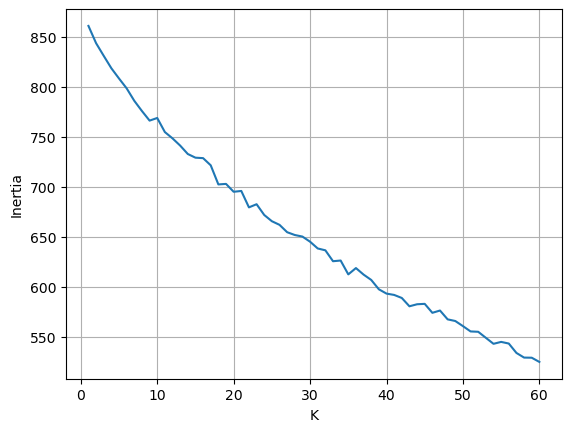

In [31]:
np.random.seed(0)  ### use the random seed.
from sklearn.cluster import MiniBatchKMeans  ### use Kmeans culster model.
def generate_elbow_plot(matrix):
    k_values = range(1, 61) ### use K between 1 and 61.
    inertia_values = [MiniBatchKMeans(k).fit(matrix).inertia_
                      for k in k_values]  ### get the inertia values by MiniBatchKMeans.fit.inertia function.
    plt.plot(k_values, inertia_values)
    plt.xlabel('K')
    plt.ylabel('Inertia') ### add x-label and y-label.
    plt.grid(True) ### add grid to the plot.
    plt.show()

generate_elbow_plot(shrunk_norm_matrix) ### generate elbow plot to get the optimal K values.

The precise location of a bent elbow-shaped transition is difficult to spot. We don't know which K-value to choose. Lets cluster our data multiple times, using K-values of 10, 15, 20, and 25. Afterwards, we’ll compare and contrast the results.

### 7. Grouping the Job Skills into 15 Clusters

Below, we’ll execute K-means using a K of 15. 

**Listing 7. 1. Clustering bullets into 15 clusters**

In [32]:
np.random.seed(0) ###use the random seed.
from sklearn.cluster import KMeans ### use Kmeans to group the data.

def compute_cluster_groups(shrunk_norm_matrix, k=15): ### K values is 15, it will present a list of panda table where 
    cluster_model = KMeans(n_clusters=k)      ### each table present a cluster and total clusters is 15.
    clusters = cluster_model.fit_predict(shrunk_norm_matrix) ###use KMeans pridict funtion to get the clusters.
    df = pd.DataFrame({'Index': range(clusters.size), 'Cluster': clusters,
                       'Bullet': total_bullets}) ### tracks each clustered bullet's index in clusters, clusters ID and text.
    return [df_cluster for  _, df_cluster in df.groupby('Cluster')] ###return the result for each clusters.

cluster_groups = compute_cluster_groups(shrunk_norm_matrix) ###apply the cluster rule into the matrix.

Each of our text clusters is stored as a Pandas table within the `cluster_groups` list. We can visualize the clusters using word clouds. Below, we will define a `cluster_to_image` function, and then apply it to `cluster_groups[0]`.

**Listing 7. 2. Visualizing the first cluster**

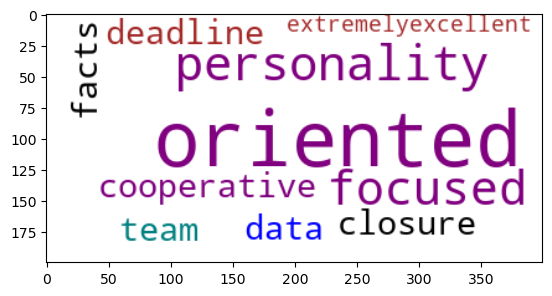

In [33]:
from wordcloud import WordCloud ###WordCloud can visualize the data and prensents the text data.
np.random.seed(0)

def cluster_to_image(df_cluster, max_words=10, tfidf_matrix=tfidf_matrix,###takes as input a df_cluster table.
                     vectorizer=vectorizer):  ### set only 10 words to appear in the image.
    indices = df_cluster.Index.values ###define indices as cluster index value.
    summed_tfidf = np.asarray(tfidf_matrix[indices].sum(axis=0))[0] ###define summed_tifdf as sum of the tfidf matrix indices.
    data = {'Word': vectorizer.get_feature_names(),'Summed TFIDF': summed_tfidf} ### use summed TFIDF to count the frequency of each words.
    df_ranked_words = pd.DataFrame(data).sort_values('Summed TFIDF', ascending=False)### rank the summed TFIDF in decending way.
    words_to_score = {word: score
                     for word, score in df_ranked_words[:max_words].values
                     if score != 0}
    cloud_generator = WordCloud(background_color='white', ### define the image background as white.
                                color_func=_color_func, ### use _color_function as color function.
                                random_state=1)
    wordcloud_image = cloud_generator.fit_words(words_to_score)
    return wordcloud_image### generate the image by WordColoud function.

def _color_func(*args, **kwargs):
    return np.random.choice(['black', 'blue', 'teal', 'purple', 'brown']) ### define specific five colors for _color_function.

wordcloud_image = cluster_to_image(cluster_groups[0]) ###show the first cluster image.
plt.imshow(wordcloud_image, interpolation="bilinear") ### define the word weights as bilinear formula.
plt.show() ### show the graph.

The language in the word-cloud appears to be describing a focused, data-oriented personality. However, that language is a little vague. Perhaps we can learn more about the cluster by printing some sample bullets from `cluster_group[0]`.

**Listing 7. 3. Printing sample bullets from Cluster 0**

In [34]:
np.random.seed(1) ### use random seed(1).
def print_cluster_sample(cluster_id):
    df_cluster = cluster_groups[cluster_id]
    for bullet in np.random.choice(df_cluster.Bullet.values, 5, 
                                   replace=False):
        print(bullet)  ###print out 5 bullet points from cluster group(id).

print_cluster_sample(0) ###print the first cluster bullet points.

Data-oriented personality
Detail-oriented
Detail-oriented — quality and precision-focused
Should be extremelyExcellent facts and data oriented
Data oriented personality


Now, lets visualize all 15 clusters using word clouds. 

**Listing 7. 4. Visualizing all 15 clusters**

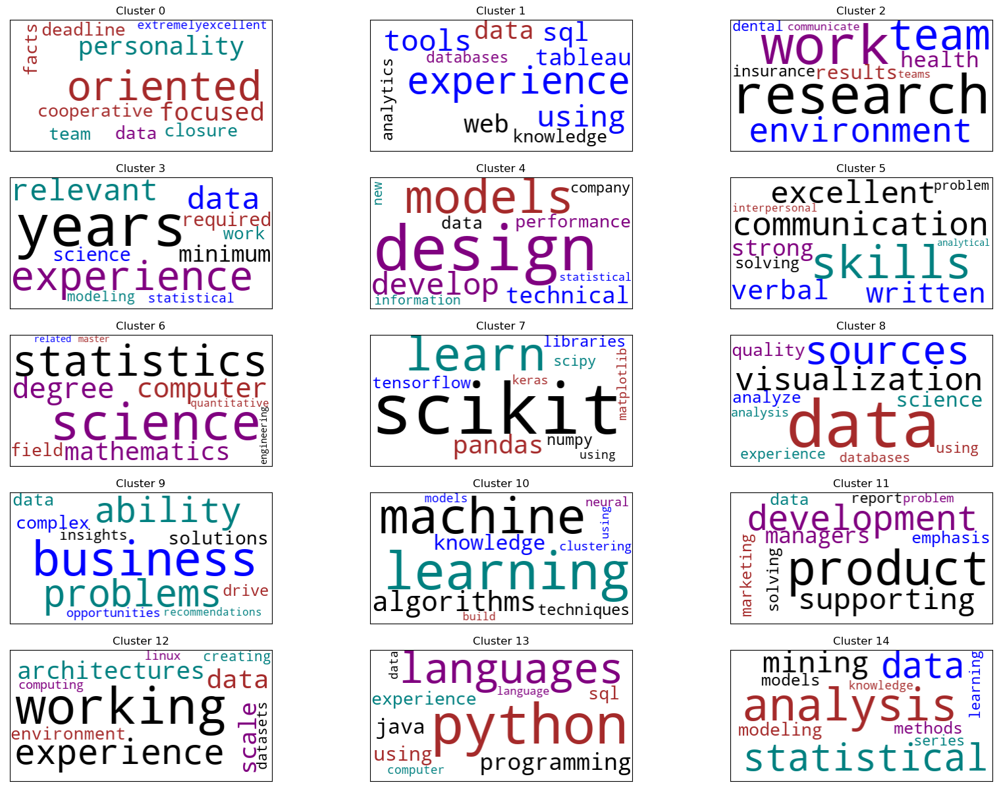

In [35]:
def plot_wordcloud_grid(cluster_groups, num_rows=5, num_columns=3, ### clusters are plotted in a 5 x 3 grid.
                        **kwargs): ###**kwargs can help to modify both vectorizer and tfidf_matrix.
    figure, axes = plt.subplots(num_rows, num_columns, figsize=(20, 15)) ### define the figure size.
    cluster_groups_copy = cluster_groups[:]
    for r in range(num_rows):
        for c in range(num_columns):
            if not cluster_groups_copy: 
                break  ### if r and c are out of range, stop the for loop.
                
            df_cluster = cluster_groups_copy.pop(0) ###remove the first element of the list, then it only exist the copy cluster group.
            wordcloud_image = cluster_to_image(df_cluster, **kwargs)###use the define cluster and **kwargs for the image.
            ax = axes[r][c] ###define the x and y as row and column.
            ax.imshow(wordcloud_image,
            interpolation="bilinear")  ###use ax.imshow to display the cluster.  
            ax.set_title(f"Cluster {df_cluster.Cluster.iloc[0]}")### make a title.
            ax.set_xticks([])
            ax.set_yticks([]) ###add empty word to the x-label and y-label.

plot_wordcloud_grid(cluster_groups)
plt.show() ###plot the grid.

Some of the clusters are highly technical. For instance, Cluster 7 fixates on external data science libraries such as Scikit-Learn, Pandas, NumPy, Matplotlib and SciPy. Lets print sample some bullets from Cluster 7, and confirm their focus on DS libraries.

**Listing 7. 5. Printing sample bullets from Cluster 7**

In [36]:
np.random.seed(1)
print_cluster_sample(7) ###print the bullet points of cluster 7.

Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Experience with machine learning libraries and platforms, like Scikit-learn and Tensorflow
Proficiency in incorporating the use of external proprietary and open-source libraries such as, but not limited to, Pandas, Scikit- learn, Matplotlib, Seaborn, GDAL, GeoPandas, and ArcPy
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib


Meanwhile, other clusters focus on non-technical skills. Perhaps we can separate the technical clusters and soft-skill clusters using text similarity (to our resume). Lets examine this possibility. We’ll start by computing the cosine similarity between each bullet in `total_bullets` and our resume.

**Listing 7. 6. Computing similarities between the bullets and our resume**

In [37]:
def compute_bullet_similarity(bullet_texts):###Computes the cosine similarities between the inputted bullet_texts and the resume variable.
    bullet_vectorizer = TfidfVectorizer(stop_words='english') ### use Tfidfvectorize to count the similarity.
    matrix = bullet_vectorizer.fit_transform(bullet_texts + [resume]) ### combine bullet texts and resume to become a matrix.
    matrix = matrix.toarray() ###convey a numpy matrix to a array.
    return matrix[:-1] @ matrix[-1] ###matrix[-1] presents resume,matrix[:-1] presents bullet texts.

bullet_cosine_similarities = compute_bullet_similarity(total_bullets) ### it contains text similarities across all clusted bullets.

Our `bullet_cosine_similarities` array contains the text similarities across all clustered bullets. For any given cluster, we can combine these cosine similarities into a single similarity score. According to our hypothesis, a technical cluster should have a higher mean similarity than a soft-skill similarity cluster. Lets confirm if this is the case for the technical Cluster 7 and the soft-skill Cluster 0.

**Listing 7. 7. Comparing mean resume similarities**

In [38]:
def compute_mean_similarity(df_cluster):
    indices = df_cluster.Index.values ###define indices as specific cluster index value.
    return bullet_cosine_similarities[indices].mean() ###get the mean of similarities.

tech_mean = compute_mean_similarity(cluster_groups[7]) ### check the similarity between cluster 7 and resume.
soft_mean =  compute_mean_similarity(cluster_groups[0])### check the similarity between cluster 1 and resume.
print(f"Technical cluster 7 has a mean similarity of {tech_mean:.3f}")###print the result in 3 decimal place.
print(f"Soft-skill cluster 3 has a mean similarity of {soft_mean:.3f}") ###print the result in 3 decimal place.

Technical cluster 7 has a mean similarity of 0.203
Soft-skill cluster 3 has a mean similarity of 0.002


The technical cluster is 10x more proximate to our resume than the soft-skill cluster. Lets compute the average similarity for all 15 clusters. Afterwards, we’ll sort the clusters by their similarity score, in descending order.

**Listing 7. 8. Sorting subplots by resume similarity**

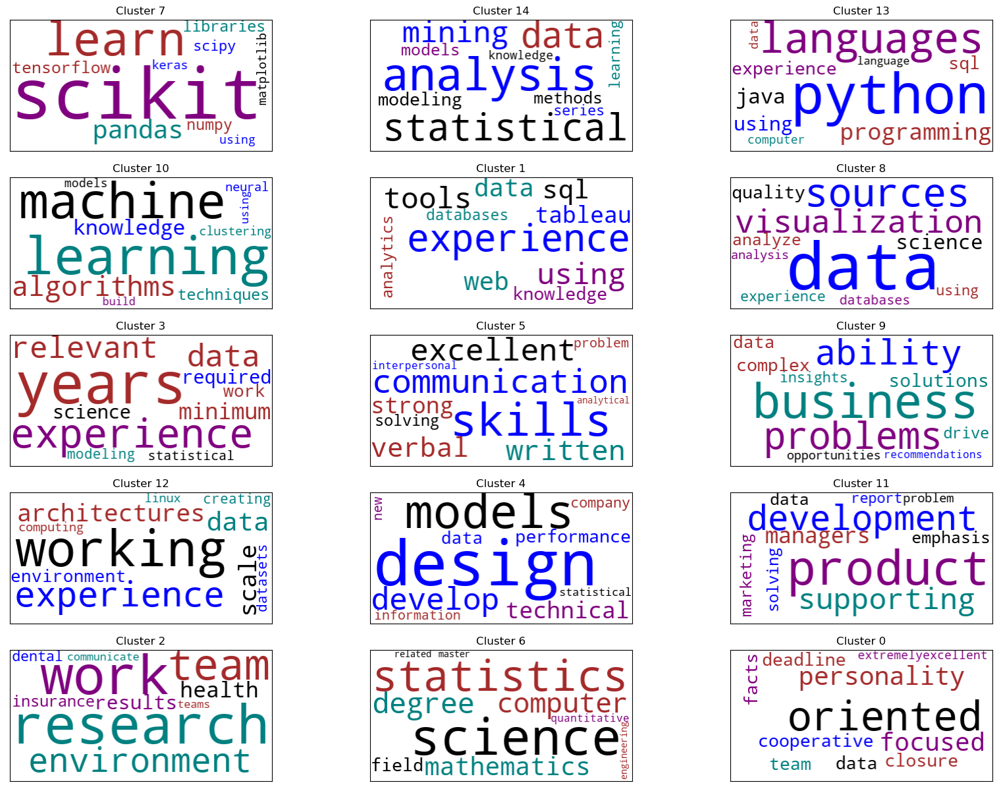

In [39]:
def sort_cluster_groups(cluster_groups):
    mean_similarities = [compute_mean_similarity(df_cluster)
                         for df_cluster in cluster_groups] ### use for loop function to count the mean between resume and 
                                                           ### each clusters.
    sorted_indices = sorted(range(len(cluster_groups)),
                            key=lambda i: mean_similarities[i],
                            reverse=True)      ###rank the mean of each cluster in decending order.
    return [cluster_groups[i] for i in sorted_indices]

sorted_cluster_groups = sort_cluster_groups(cluster_groups) ###use sorted_cluster_groups to present the function.
plot_wordcloud_grid(sorted_cluster_groups)
plt.show() ###plot the images.

Our hypothesis was right! The first 2 rows within the updated subplot clearly correspond to technical skills. F

### 8.1 Investigating the Technical Skill Clusters
Lets turn our attention to the 6 technical-skill cluster within first 2 rows of subplot grid. Below, we’ll re-plot their associated word-clouds in a 2-row by 3-column grid. 

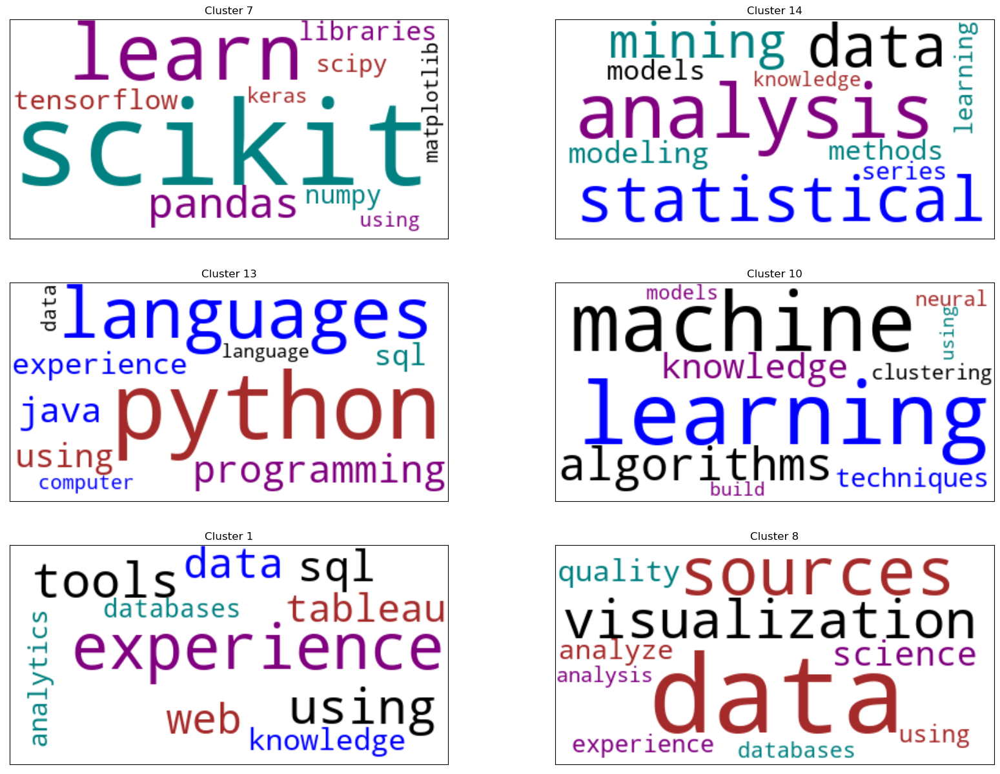

In [40]:
plot_wordcloud_grid(sorted_cluster_groups[:6], num_rows=3, num_columns=2)### plot the top six similarity clusters.
plt.show() ##plot it out and they also belong to technical skills.

The first 2 rows are insightful. We'll need to brush up on our machine learning skills. However, the final 2 technical-skill clusters appear are vague and uninformative. Below, we’ll sample bullets from these clusters (8 and 1) in order to confirm a lack of pattern.

**Listing 8. 2. Printing sample bullets from Clusters 8 and 1**

In [41]:
np.random.seed(1)
for cluster_id in [8, 1]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)  ### print out the bullet texts of cluster 8 and 1.


Cluster 8:
Use data to inform and label customer outcomes and processes
Perform exploratory data analysis for quality control and improved understanding
Champion a data-driven culture and help develop best-in-class data science capabilities
Work with data engineers to plan, implement, and automate integration of external data sources across a variety of architectures, including local databases, web APIs, CRM systems, etc
Design, implement, and maintain a cutting-edge cloud-based data-infrastructure for large data-sets

Cluster 1:
Have good knowledge on Project management tools JIRA, Redmine, and Bugzilla
Using common cloud computing platforms including AWS and GCP in addition to their respective utilities for managing and manipulating large data sources, model, development, and deployment
Experience in project deployment using Heroku/Jenkins and using web Services like Amazon Web Services (AWS)
Expert level data analytics experience with T-SQL and Tableau
Experience reviewing and asse

We’ve finished our analysis of the technical-skill clusters. 4 of these clusters were relevant. 2 were not. Now, lets turn our attention to the remaining soft-skill clusters.

### 9. Investing the Soft-Skill Clusters
We’ll start by visualizing the remaining 9 soft-skill clusters in a 3-row by 3-column grid.

**Listing 9. 1. Plotting the remaining 9 soft-skill clusters**

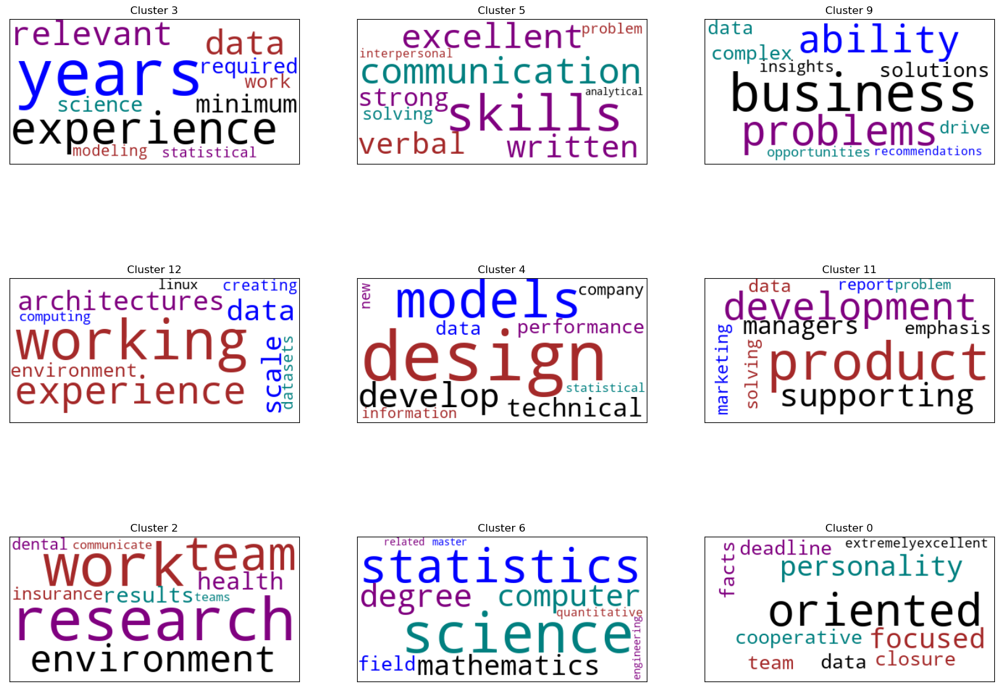

In [42]:
plot_wordcloud_grid(sorted_cluster_groups[6:], num_rows=3, num_columns=3)
plt.show() ###plot the cluters between 7th and 15th similarity clusters.

The remaining clusters appear abmbiguous. Also, our soft-skill clusters do not represent true skills! For instance, Cluster 3 (row 0, column 0) consists of bullets requiring a minimal count of years working in industry. Similarly, Cluster 6 (row 2, column 1) represents educational constraints; requiring a quantitative degree to land an interview. 

**Listing 9. 2. Printing sample bullets from Clusters 6 and 3**

In [43]:
np.random.seed(1)
for cluster_id in [6, 3]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)### display the cluster 6 and 3 bullet texts.


Cluster 6:
MS in a quantitative research discipline (e.g., Artificial Intelligence, Computer Science, Machine Learning, Statistics, Applied Math, Operations Research)
Master’s degree in data science, applied mathematics, or bioinformatics preferred.
PhD degree preferred
Ph.D. in a quantitative discipline (e.g., statistics, computer science, economics, mathematics, physics, electrical engineering, industrial engineering or other STEM fields)
7+ years of experience manipulating data sets and building statistical models, has advanced education in Statistics, Mathematics, Computer Science or another quantitative field, and is familiar with the following software/tools:

Cluster 3:
Minimum 6 years relevant work experience (if Bachelor’s degree) or minimum 3 years relevant work experience (if Master’s degree) with a proven track record in driving value in a commercial setting using data science skills.
Minimum five (5) years of experience manipulating data sets and building statistical mode

However, one of our soft-skill clusters is very easy to interpret. Cluster 5 (row 0, column 1) focuses on interpersonal communication skills; both written and verbal. 


### 10. Exploring Clusters at Alternative Values of K

Lets we’ll regenerate the clusters using alternative values of K. We’ll begin by setting K to 25, and plotting the results in a 5-row by 5-column grid. The subplots will be sorted based on cluster similarity to our resume. 

**Listing 10. 1. Visualizing 25 sorted clusters**

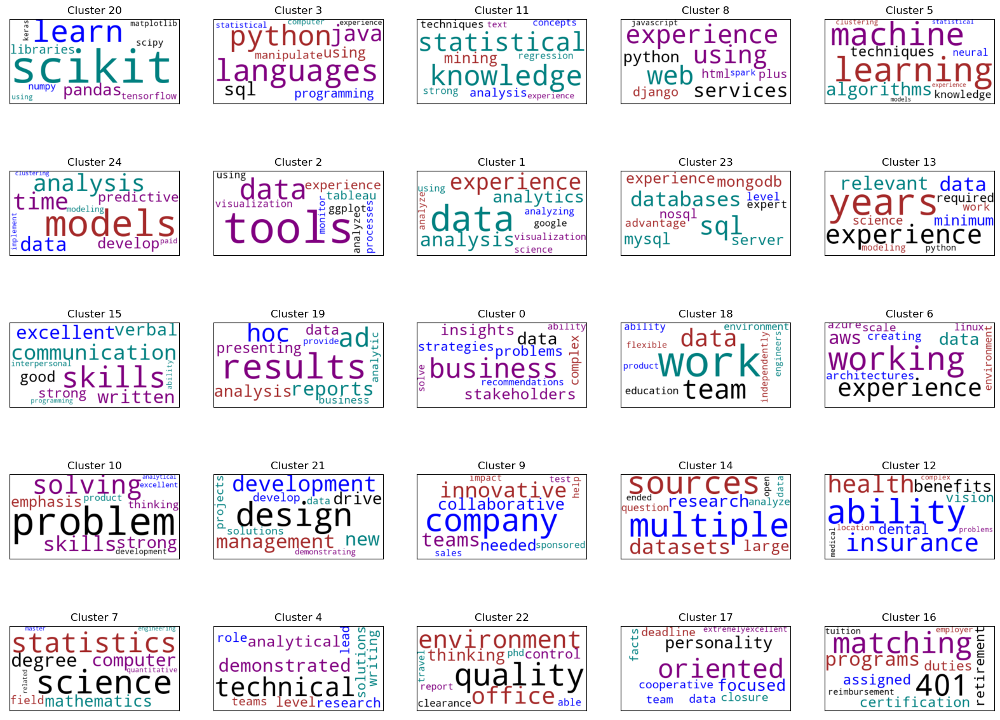

In [44]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=25)  ### K values is 25, it will present a list of panda table where 
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 25.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=5)### use 5x5 grid to present the clusters.
plt.show()

Raising K from 15 to 25 has retained all previously-observed insightful clusters. Also, the parameter change has introduced several new interesting clusters (Including Cluster 2: Non-Python Visualization tools and Cluster 23; Databases) Will the stability of these clusters persist if we shift K to an intermediate value of 20? Lets find out.

**Listing 10. 2. Visualizing 20 sorted clusters**

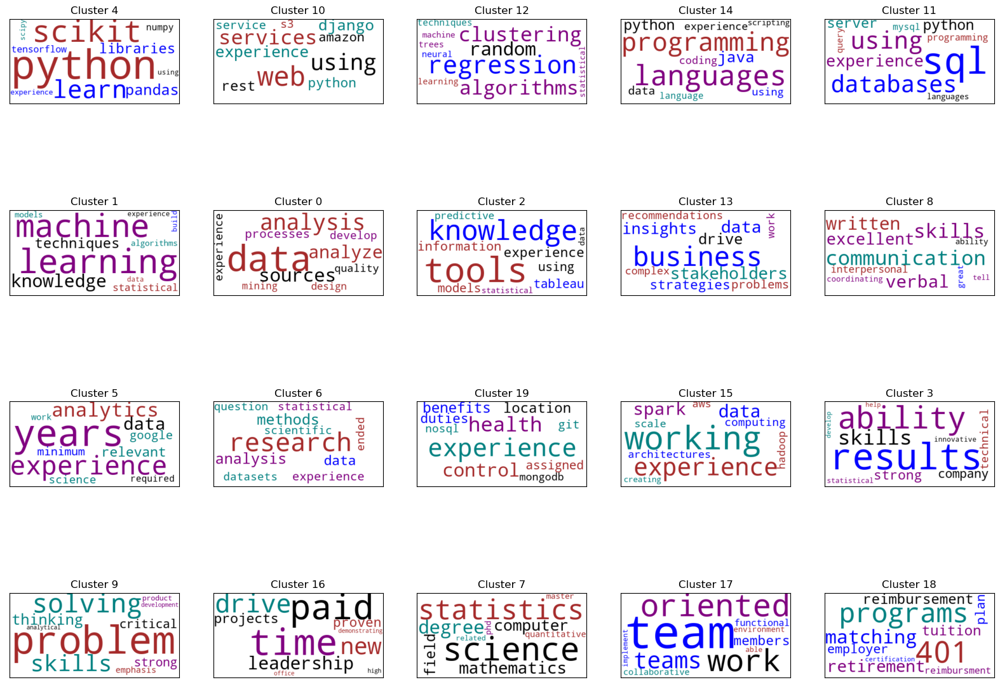

In [45]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=20)### K values is 20, it will present a list of panda table where
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 20.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=4, num_columns=5)###use 4x5 grid to present the clusters.
plt.show()

Most of our observed insightful clusters remain at `k=20`. However, the statistical analysis cluster observed at K-values of 15 and 25 is currently missing. If we cluster over just a single value of K, we risk missing out on useful insights. Thus, it’s preferable to visualize results over a range of K-values during text analysis. With this in mind, lets see what happens when we drop K to 10.

**Listing 10. 3. Visualizing 10 sorted clusters**

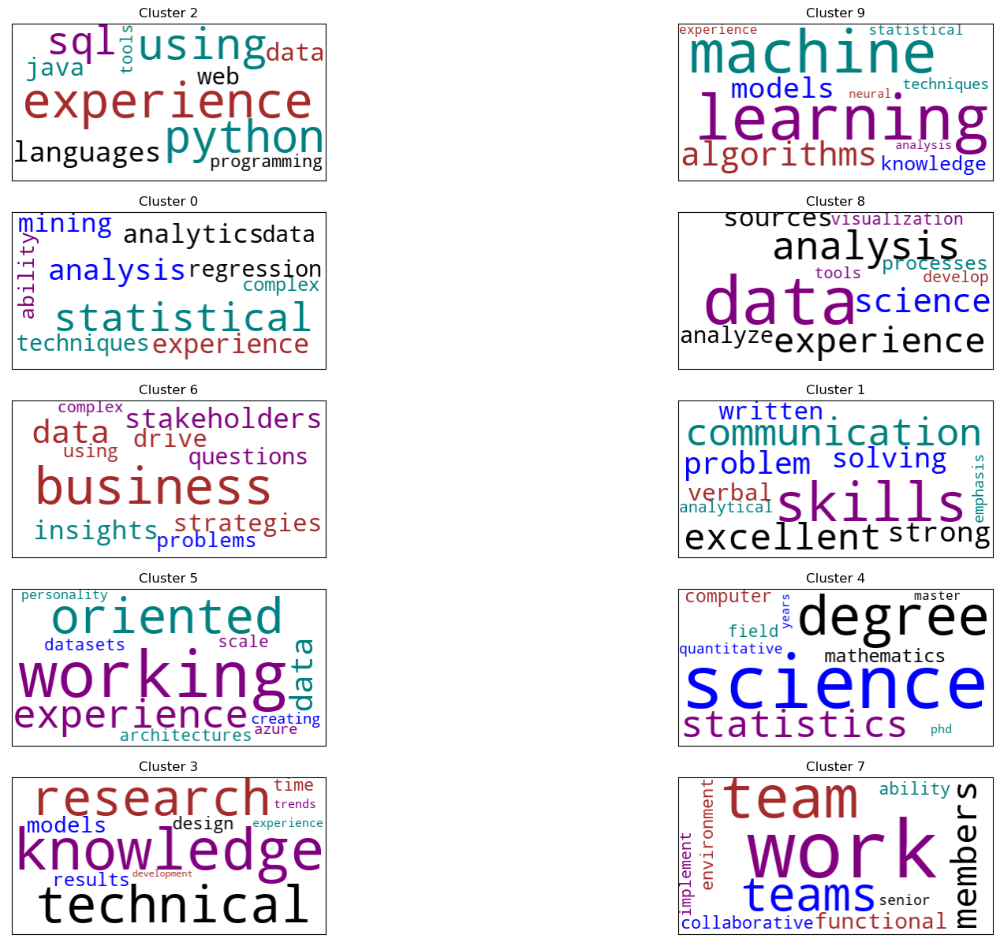

In [46]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=10)### K values is 10, it will present a list of panda table where
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 10.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=2)###use 5x2 grid to presents the clusters.
plt.show()

The 10 visualized clusters are quite limited. Nonetheless, 4 of the 10 clusters contain the critical skills we’ve previously observed. These include Python programming (row 0, column 0), machine learning (row 0, column 1), and communication skills (row 2, column 1). Also, the statistical analysis cluster has reappered (row 1, column 0).
Surprisingly, some of our skill-clusters are quite versatile. 

So far, our observations have been limited to the 60 most relevant job postings. What will happen if we extand our analysis to the top 700 postings?  We’ll now find out.

### 11.Analyzing the 700 Most-Relevant Postings

We’ll start by preparing `sorted_df_jobs[:700].Bullets` for clustering.

**Listing 11. 1. `Preparing sorted_df_jobs[:700]` for clustering analysis**

In [47]:
np.random.seed(0) ### use random seed.
total_bullets_700 = set() ### create an empty set for 700 job postings bullets.
for bullets in sorted_df_jobs[:700].Bullets:
    total_bullets_700.update([bullet.strip()
                              for bullet in bullets])

total_bullets_700 = sorted(total_bullets_700) ### sort the bullets in 700 job postings.
vectorizer_700 = TfidfVectorizer(stop_words='english') ### use Tfidfvectorizer to count the English word frequencies.
tfidf_matrix_700 = vectorizer_700.fit_transform(total_bullets_700)### tranfer it to become a matrix.
shrunk_norm_matrix_700 = shrink_matrix(tfidf_matrix_700) ###make the dimensional reduction and normalize the matrix.
print(f"We've vectorized {shrunk_norm_matrix_700.shape[0]} bullets") ###print our the number of bullets.

We've vectorized 10194 bullets


We’ve vectorized 10,194 bullet-points. Now, we’ll generate an Elbow plot across the vectorized results. Based on previous observations, we don’t expect the Elbow plot to be particularly informative. 

**Listing 11. 2. Plotting an elbow curve for 10,194 bullets**

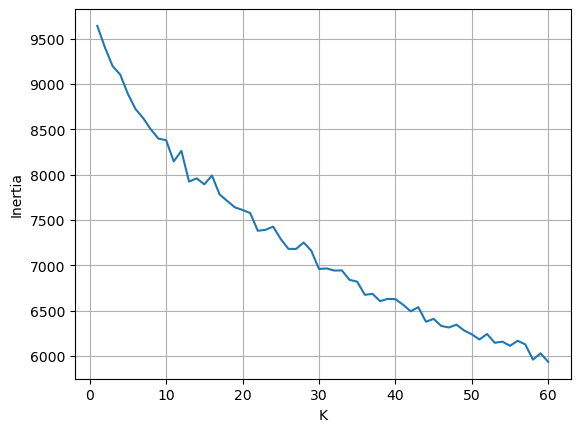

In [48]:
np.random.seed(0)
generate_elbow_plot(shrunk_norm_matrix_700)###create the elbow plot to choose optimal k means.

As expected, the precise location of the elbow is not clear within the plot. The elbow is spread out between a K of 10 and 25. We’ll deal with ambiguity, by arbitrarily setting K to 20.

**WARNING: As we discussed in Section Fifteen, the K-means outputs could vary across computers for large matrices containing 10,000-by-100 elements. Thus, your local clustering results might differ from the output seen below. Nonetheless, you should be able to draw similar conclusions to the ones presented in this book.**

**Listing 11. 3. Visualizing 20 sorted clusters for 10,194 bullets**

In [49]:
np.random.seed(0)
from sklearn.cluster import KMeans ### use Kmeans to group the data.
def compute_cluster_groups2(shrunk_norm_matrix_700, k=15): ### K values is 15, it will present a list of panda table where 
    cluster_model = KMeans(n_clusters=k)      ### each table present a cluster and total clusters is 15.
    clusters = cluster_model.fit_predict(shrunk_norm_matrix_700) ###use KMeans pridict funtion to get the clusters.
    df = pd.DataFrame({'Index': range(clusters.size), 'Cluster': clusters,
                       'Bullet': total_bullets_700}) ### tracks each clustered bullet's index in clusters, clusters ID and text.
    return [df_cluster for  _, df_cluster in df.groupby('Cluster')] ###return the result for each clusters.
cluster_groups2 = compute_cluster_groups2(shrunk_norm_matrix_700)

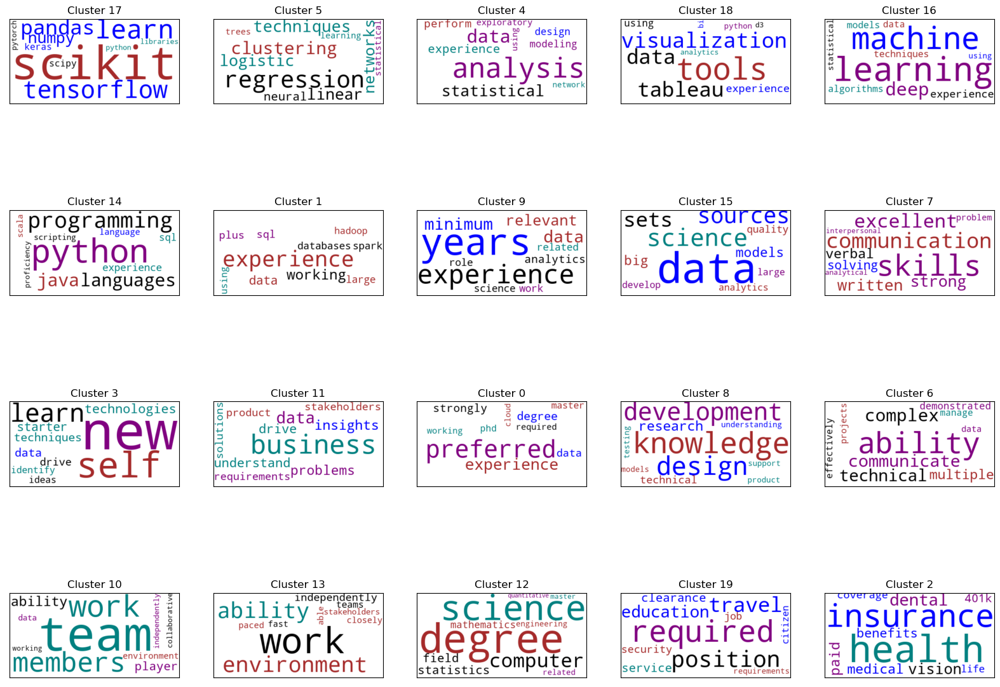

In [50]:
np.random.seed(0)
cluster_groups_700 = compute_cluster_groups2(shrunk_norm_matrix_700, k=20)### use 20 clusters to group the matrix.
bullet_cosine_similarities = compute_bullet_similarity(total_bullets_700)###count the similarities between clusters and resume.
sorted_cluster_groups_700 = sort_cluster_groups(cluster_groups_700)### sort the cluster similarities.
plot_wordcloud_grid(sorted_cluster_groups_700, num_rows=4, num_columns=5,
                    vectorizer=vectorizer_700, tfidf_matrix=tfidf_matrix_700)###present the cluster in 4x5 grid.

Our clustering output looks very similar to what we’ve seen before. The key insightful clusters we’ve observed at 60 postings still remain.

# Conclusion

In conclusion, improving our resume, we should add "we are proficient in Python" and apply two sentences in the table of contents which are "Collaborated with teammates on a difficult data problem." and "Conveyed complex results, in oral or written form, to a nontechnical audience."

## **1.Solution Steps**
1.Loading HTML files and count the title and body texts for duplicates.<br>
2.Exploring the HTML for skill description and measure the percent of bulleted postings.<br>
3.Examing the top-ranked words in HTML bullets and non-bullet contents.<br>
4.Checking the titles for reference to data science.<br>
5.Filtering Jobs by Relevance base on key words.<br>
6.Clusering Skills in relevance job postings.<br>
7.Grouping the job skills into 15 Clusters.<br>
8.Investigating the technical skill clusters.<br>
9.Investigating the soft-skill clusters.<br>
10.Exploring Clusters at Alternative Value of K.<br>
11.Analyzing the 700 Most-Relevant Postings<br><br>
## **2.Weakness of Case 4 Solution**

## 2.1 General Key Words Filtering in Job Titles
In the step **5**(Filtering Jobs by Relevance base on key words), the solution only appied two key words which are "Data Scien" and "Data Analy" in relevance definition so many carrer fields' relevances such as Statiscian and statistical officer were decreased. Also, it only appiled one key word "Manager" to define the irrevalent job postings to aviod the non-fresh graduate jobs, and it is suggested to add one more key word to prevent the jobs which may need working experiences.Besides, the solution used top 60 relevant job posts to generate the key skills and clustered them, key skills in Statiscian were ignored.<br>
## 2.2 Meaningless Words Ranking before Filtering Irrelevant Job
In the Step **3**(Examing the top-ranked words in HTML bullets and non-bullet contents), it is meaningless to count the top-ranked words when job postings are not filtered. The top-ranked words cannot help us to obtian the key words to data scientist with many irrelevant job postings.<br>

## 2.3 Do not Utilize the Skills Description in Different K-values Clusters and Different Total Amount of Job Postings.
For the step **10**(Exploring Clusters at Alternative Value of K) and step step **11**, the solution only shows the cluster results of different k-values and do not really use of the result of different k-value, also, it does not utilize the results of the most 60 high relevant job postings and the 700 highest relevant job postings to obtain the better conclusion. 


## 3.Approaches to Improve the Weaknesses.

## 3.1 General Key Words Filtering in Job Titles.
For the step **5**, it is suggest adding more key words to filter the job postings to get more specific results,
such as ("Statistic") in order to get the jobs like Statistician or Statistical Officer|Assistant job skills 
and requirements. Also, adding one key word--Senior to filter out the jobs which require working experiences.<br>

In [51]:
import re ###re module provides regular expression matching operations.

#### Previous solution.
def percent_relevant_titles1(df):
    regex_relevant1 = re.compile(r'Data (Scien|Analy)', ###use re function to define the relevant by contain key words
                                flags=re.IGNORECASE)   ### such as Data Scien or Data Analy.
    regex_irrelevant1 = re.compile(r'\b(Manage)',        ### use re function to define the irrelevant by contain key word
                                  flags=re.IGNORECASE) ### xxxx mangae.
    match_count = len([title for title in df.Title     ### use for loop to match each post titles.
                       if regex_relevant1.search(title)  ### define count rule if it belongs regex_relevant and not regex
                       and not regex_irrelevant1.search(title)]) #### _irrelevant, calculate the frequency of specific post titles.
    percent1 = 100 * match_count / df.shape[0] ### calculate the percentage.
    return percent1

percent1_1 = percent_relevant_titles1(sorted_df_jobs[280: 300])### count the relevant percentage between 280th and 300th post titles.
percent1_2 = percent_relevant_titles1(sorted_df_jobs[320: 340])### count the relevant percentage between 320th and 340th post titles.



#### Improve Solution
def percent_relevant_titles2(df):
    regex_relevant2 = re.compile(r'Data (Scien|Analy)|Statistic', ###Add one more key word "Statistic" to improve the relevance.
                                flags=re.IGNORECASE)   ### such as Data Scien or Data Analy.
    regex_irrelevant2 = re.compile(r'\b(Manage)|Senior',        ### use re function to define the irrelevant by contain key word
                                  flags=re.IGNORECASE) ### xxxx mangae.
    match_count = len([title for title in df.Title     ### use for loop to match each post titles.
                       if regex_relevant2.search(title)  ### define count rule if it belongs regex_relevant and not regex
                       and not regex_irrelevant2.search(title)]) #### _irrelevant, calculate the frequency of specific post titles.
    percent2 = 100 * match_count / df.shape[0] ### calculate the percentage.
    return percent2

percent2_1 = percent_relevant_titles2(sorted_df_jobs[280: 300])### count the relevant percentage between 280th and 300th post titles.
percent2_2 = percent_relevant_titles2(sorted_df_jobs[320: 340])### count the relevant percentage between 320th and 340th post titles.
print(f"Previous solution: Approximately {percent1_1:.2f}% of job titles between indices " ### make the percentage to round up to two decimal place then
       "280 - 300 are relevant")   ### pirnt it out.

print(f"     New solution: Approximately {percent2_1:.2f}% of job titles between indices " ### make the percentage to round up to two decimal place then
       "280 - 300 are relevant")  ### pirnt it out.
print(f"")
print(f"Previous solution: Approximately {percent1_2:.2f}% of job titles between indices " ### make the percentage to round up to two decimal place then
       "320- 340 are relevant")   ### pirnt it out.
print(f"     New solution: Approximately {percent2_2:.2f}% of job titles between indices " ### make the percentage to round up to two decimal place then
       "320- 340 are relevant")   ### pirnt it out.

Previous solution: Approximately 70.00% of job titles between indices 280 - 300 are relevant
     New solution: Approximately 50.00% of job titles between indices 280 - 300 are relevant

Previous solution: Approximately 70.00% of job titles between indices 320- 340 are relevant
     New solution: Approximately 75.00% of job titles between indices 320- 340 are relevant


Firstly, there is a twenty percents decrease between 280th and 300th jobs in job title relevances when new key words--"Statistic" and "Senior" are added in the filter section. It helps us to avoid more senior job positions which require many years working experience in that job fields.<br><br>
Secondly,there is a five percents increase between 320th and 340th jobs in job title relevances by including more statiscian jobs.<br><br>
Finally, we will cluster skills for the most 60 relevant job posts and this filter improvement can help us to get more skills in statisticial jobs and avoid skills for being a senior position jobs.

## 3.1.1 Plot Compasion for Job Title Relevance.

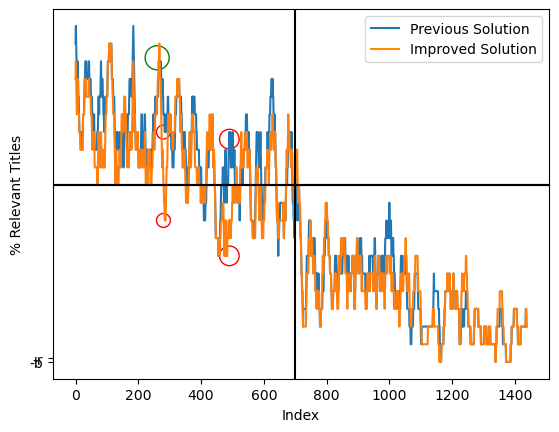

In [52]:
from matplotlib import pyplot as plt
def relevant_title_plot1(index_range=20): ###define the range parameter for each 20 posts.
    percentages1 = []
    start_indices1 = range(df_jobs.shape[0] - index_range) ### start the range from 0 and total posting count minus the
    for i in start_indices1:                              ###  index_range(20).
        df_slice = sorted_df_jobs[i: i + index_range]### start at 0 to 20, 20 to 40 ... posts.
        percent1 = percent_relevant_titles1(df_slice) ### percentage of relevant posts in each intervals.
        percentages1.append(percent1)   ### store the percentage of each intervals into the percent data set.

    plt.plot(start_indices1, percentages1) 
    plt.axhline(50, c='k')  ###add the horizontal line y=50, it means that we only consider the job posts with
    plt.xlabel('Index')    ### 50% relevant or above.
    plt.ylabel('% Relevant Titles') ### add x-label and y-label to the plot.
plt.scatter( 280 , 65 , s=100 ,  facecolors='none', edgecolors='red' ) ### Make a circle to the graph.
plt.scatter( 490 , 63 , s=200 ,  facecolors='none', edgecolors='red' ) 

relevant_title_plot1()


def relevant_title_plot2(index_range=20): ###define the range parameter for each 20 posts.
    percentages2 = []
    start_indices2 = range(df_jobs.shape[0] - index_range) ### start the range from 0 and total posting count minus the
    for i in start_indices2:                              ###  index_range(20).
        df_slice = sorted_df_jobs[i: i + index_range]### start at 0 to 20, 20 to 40 ... posts.
        percent2 = percent_relevant_titles2(df_slice) ### percentage of relevant posts in each intervals.
        percentages2.append(percent2)   ### store the percentage of each intervals into the percent data set.

    plt.plot(start_indices2, percentages2) 
    plt.axhline(50, c='k')  ###add the horizontal line y=50, it means that we only consider the job posts with
    plt.xlabel('Index')    ### 50% relevant or above.
    plt.ylabel('% Relevant Titles') ### add x-label and y-label to the plot.
plt.scatter( 280 , 40 , s=100 ,  facecolors='none', edgecolors='red' ) ### Make a circle to the graph.
plt.scatter( 490 , 30 , s=200 ,  facecolors='none', edgecolors='red' ) 
plt.scatter( 260 , 86 , s=300 ,  facecolors='none', edgecolors='green' ) 
relevant_title_plot2()
plt.plot("-b", label="Previous Solution",color="C0") ### add the label and color to the graph.
plt.plot("-r", label="Improved Solution",color="darkorange")
leg=plt.legend(loc="upper right") ### add the legend in the upper right area.
plt.axvline(700, c='k') ### add vertical line to set a cutoff(700).
plt.show()  ###print the graph.



From the above graph, the relevance trend was mostly decreased when the new filter was applied. There are many circles to point out some changes.<br>
It is believed that the decreased area is caused by fitering out more senior job and the increased part is caused by including more statistical jobs in relevance.

## 3.2 Meaningless Words Ranking before Filtering Irrelevant Job

In order to improve the efficence of words couting, it is necessary to do step **4 & 5** which are filter irrelevant job postings before ranking the key words and use most 700 relevant job titles. The reason for the cutoff numbers 700 is that we would like to remove the job postings below 50% relevance in job titles.

In [53]:
###Previouse Solution
all_bullets = []  ### create the empty set for the bullet words.
for bullet_list in df_jobs.Bullets:
    all_bullets.extend(bullet_list)  ### appends the elements to the end of the current list.


###Improve Solution
total_bullets = []   ###create an empty set for the 700 most-relevant jobs.
for bullets in sorted_df_jobs[:700].Bullets: ### use for loop to open top 700 job posts in high relevance..
    total_bullets.extend(bullets)  ### appends the elements to the end of the current list.

In [54]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer ### use TFIDF matrix to rank the frequencies of words.

def rank_words(text_list): ### define the rank euqation.
    vectorizer = TfidfVectorizer(stop_words='english') ### use TFIDF to detect English words.
    tfidf_matrix = vectorizer.fit_transform(text_list).toarray() ### vectorize the text list and make it becomes a matrix
    df = pd.DataFrame({'Words': vectorizer.get_feature_names(),
                       'Summed TFIDF': tfidf_matrix.sum(axis=0)}) ### compute TFIDF matrix and sum across the rows of the matrix.
    sorted_df = df.sort_values('Summed TFIDF', ascending=False) ### sort the summed TFIDF in decending way.
    return sorted_df  
###previous solution.
print(f"The previous result:")
sorted_df = rank_words(all_bullets) ### use the rank function which define previously to rank the all_bullets.
print(sorted_df[:5].to_string(index=False)) ### print out the first five highest frequencies word base on summed TFIDF.
###return a sorted pandas table of top-ranked words.
print(f"")
print(f"The new result:")
###Improved solution.
sorted_df = rank_words(total_bullets) ### use the rank function which define previously to rank the all_bullets.
print(sorted_df[:5].to_string(index=False)) ### print out the first five highest frequencies word base on summed TFIDF.
###return a sorted pandas table of top-ranked words.


The previous result:
     Words  Summed TFIDF
experience    878.030398
      data    842.978780
    skills    440.780236
      work    371.684232
   ability    370.969638

The new result:
     Words  Summed TFIDF
      data    535.797825
experience    501.065017
  learning    220.529505
    skills    217.545330
     years    214.779277


Firstly, the new result words frequencies are all decreased because the improved code only counts the most 700 relevant job postings wherea the old solution counts total 1485 job postings.<br><br>
Secondly, all words ranking changes and there are two new key words in new results which are "learning"&"years" instead of "work"&"ability". They are more meaningful than "work" and "ability" in the previous result since we add key word "statistic" in the filter setting.<br><br>
Finally, "learning" & " years" may repensent machine learning, deep learning and year of working experince in job skills and they helps us to indicate the machine learning is essential to our resume. Therefore, the new improvement which are words rank after filtering irrelevant job postings is more helpful than previous setting.

## 3.3 Do not Utilize the Skills Description in Different K-values Clusters and Different Total Amount of Job Postings.

The previous solution use k=10,15,20,25 clusters to group the data, and it only shows the grid of different clusters without combination.Therefore, we would like to combine the bullets of first sorted clusters of different k values  in order to observe better conclusion to improve our resume.

Then, the previous solution also compute the 700 highest relevant job postings with k=20, and we can also put the bullets of first sorted clusters in the combination, then we can get the best 5 clusters to improve our resume.

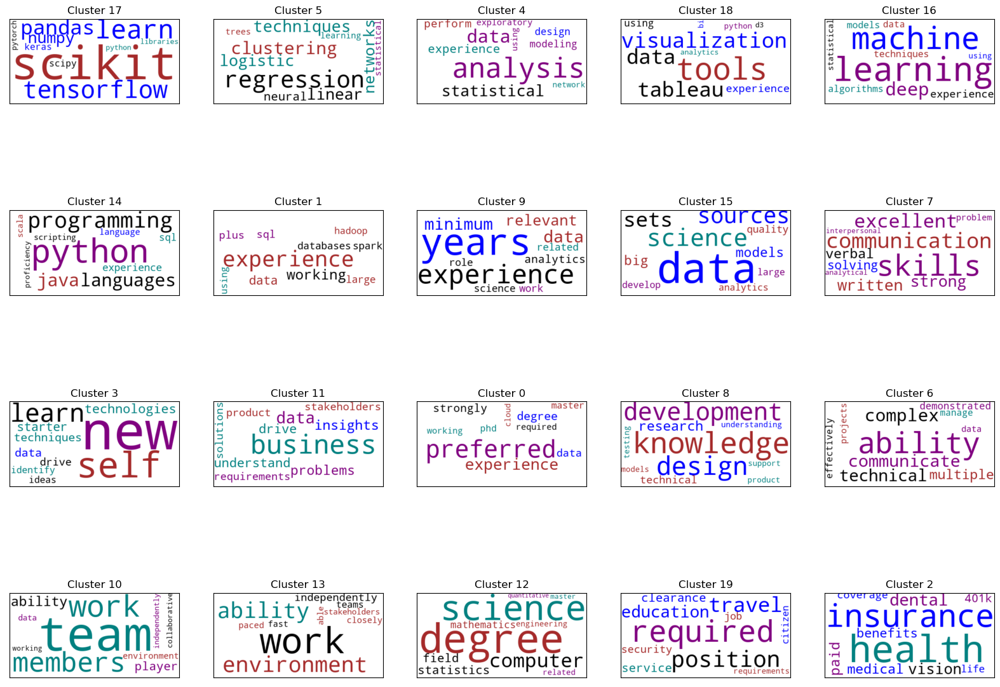

In [55]:
###K=20 for the 700 highest relevant job postings.
np.random.seed(0)
cluster_groups_700 = compute_cluster_groups2(shrunk_norm_matrix_700, k=20)### use 20 clusters to group the matrix.
bullet_cosine_similarities = compute_bullet_similarity(total_bullets_700)###count the similarities between clusters and resume.
sorted_cluster_groups_700 = sort_cluster_groups(cluster_groups_700)### sort the cluster similarities.
plot_wordcloud_grid(sorted_cluster_groups_700, num_rows=4, num_columns=5,
                    vectorizer=vectorizer_700, tfidf_matrix=tfidf_matrix_700)###present the cluster in 4x5 grid.

In [56]:
np.random.seed(1) ### use random seed(1).
def print_cluster_sample(cluster_id):
    df_cluster = cluster_groups_700[cluster_id]
    for bullet in np.random.choice(df_cluster.Bullet.values, 5, 
                                   replace=False):
        print(bullet)  ###print out 5 bullet points from cluster group(id).
for cluster_id in [17]:        
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(17) ###print the 17th cluster bullet points.


Cluster 17:
Experience with toolkits such as TensorFlow, PyTorch, or Keras
Experience in deep learning framework such as TensorFlow, PyTorch, CNTK, etc
Expertise with statistical software packages like R, Python, MatLab, NumPy, SciPy, or SAS
Proficiency in Python (scikit learn, pandas, numpy etc.) SAS, SQL, R & MATLAB, C/C++, Jupyter Notebook
Experience with python analytical packages (eg. pandas, PySpark, statsmodels, scikit-learn, matplotlib, or similar)


## Repeat the Setting.

In [57]:
total_bullets = []   ###create an empty set for the 60 most-relevant jobs.
for bullets in sorted_df_jobs[:60].Bullets: ### use for loop to open each job posts.
    total_bullets.extend(bullets)  ### appends the elements to the end of the current list.
    
df_bullets = pd.DataFrame({'Bullet': total_bullets}) ### make total bullets become two dimentional array data.

total_bullets = sorted(set(total_bullets)) ###Converts total_bullets into a set to remove duplicates.
vectorizer = TfidfVectorizer(stop_words='english')###define vectorizer using TfidfVectorize and only detect English words.
tfidf_matrix = vectorizer.fit_transform(total_bullets)###makes total_bullets into matrix format.
num_rows, num_columns = tfidf_matrix.shape ###define rows and columns as num_rows and num_columns.

import numpy as np
from sklearn.decomposition import TruncatedSVD  ### use SVD modules to reduce TFIDF matrix dimensions.
from sklearn.preprocessing import normalize  ### normalize the data.
np.random.seed(0)  ### random seed.
def shrink_matrix(tfidf_matrix):
    svd_object = TruncatedSVD(n_components=100) ### shink the matrix to 100 dimensions with SVD.
    shrunk_matrix = svd_object.fit_transform(tfidf_matrix) ### get the shrunk matrix by svd tranksform function.
    return normalize(shrunk_matrix) ###normalize the new matrix.
 
shrunk_norm_matrix = shrink_matrix(tfidf_matrix)  ### get the nomral shrunk matrix.

np.random.seed(0) ###use the random seed.
from sklearn.cluster import KMeans ### use Kmeans to group the data.

def compute_cluster_groups(shrunk_norm_matrix, k=15): ### K values is 15, it will present a list of panda table where 
    cluster_model = KMeans(n_clusters=k)      ### each table present a cluster and total clusters is 15.
    clusters = cluster_model.fit_predict(shrunk_norm_matrix) ###use KMeans pridict funtion to get the clusters.
    df = pd.DataFrame({'Index': range(clusters.size), 'Cluster': clusters,
                       'Bullet': total_bullets}) ### tracks each clustered bullet's index in clusters, clusters ID and text.
    return [df_cluster for  _, df_cluster in df.groupby('Cluster')] ###return the result for each clusters.

cluster_groups = compute_cluster_groups(shrunk_norm_matrix) ###apply the cluster rule into the matrix.

from wordcloud import WordCloud ###WordCloud can visualize the data and prensents the text data.
np.random.seed(0)

def cluster_to_image(df_cluster, max_words=10, tfidf_matrix=tfidf_matrix,###takes as input a df_cluster table.
                     vectorizer=vectorizer):  ### set only 10 words to appear in the image.
    indices = df_cluster.Index.values ###define indices as cluster index value.
    summed_tfidf = np.asarray(tfidf_matrix[indices].sum(axis=0))[0] ###define summed_tifdf as sum of the tfidf matrix indices.
    data = {'Word': vectorizer.get_feature_names(),'Summed TFIDF': summed_tfidf} ### use summed TFIDF to count the frequency of each words.
    df_ranked_words = pd.DataFrame(data).sort_values('Summed TFIDF', ascending=False)### rank the summed TFIDF in decending way.
    words_to_score = {word: score
                     for word, score in df_ranked_words[:max_words].values
                     if score != 0}
    cloud_generator = WordCloud(background_color='white', ### define the image background as white.
                                color_func=_color_func, ### use _color_function as color function.
                                random_state=1)
    wordcloud_image = cloud_generator.fit_words(words_to_score)
    return wordcloud_image### generate the image by WordColoud function.

def _color_func(*args, **kwargs):
    return np.random.choice(['black', 'blue', 'teal', 'purple', 'brown']) ### define specific five colors for _color_function.

np.random.seed(1) ### use random seed(1).
def print_cluster_sample(cluster_id):
    df_cluster = cluster_groups[cluster_id]
    for bullet in np.random.choice(df_cluster.Bullet.values, 5, 
                                   replace=False):
        print(bullet)  ###print out 5 bullet points from cluster group(id).

def plot_wordcloud_grid(cluster_groups, num_rows=5, num_columns=3, ### clusters are plotted in a 5 x 3 grid.
                        **kwargs): ###**kwargs can help to modify both vectorizer and tfidf_matrix.
    figure, axes = plt.subplots(num_rows, num_columns, figsize=(20, 15)) ### define the figure size.
    cluster_groups_copy = cluster_groups[:]
    for r in range(num_rows):
        for c in range(num_columns):
            if not cluster_groups_copy: 
                break  ### if r and c are out of range, stop the for loop.
                
            df_cluster = cluster_groups_copy.pop(0) ###remove the first element of the list, then it only exist the copy cluster group.
            wordcloud_image = cluster_to_image(df_cluster, **kwargs)###use the define cluster and **kwargs for the image.
            ax = axes[r][c] ###define the x and y as row and column.
            ax.imshow(wordcloud_image,
            interpolation="bilinear")  ###use ax.imshow to display the cluster.  
            ax.set_title(f"Cluster {df_cluster.Cluster.iloc[0]}")### make a title.
            ax.set_xticks([])
            ax.set_yticks([]) ###add empty word to the x-label and y-label.
            
def compute_bullet_similarity(bullet_texts):###Computes the cosine similarities between the inputted bullet_texts and the resume variable.
    bullet_vectorizer = TfidfVectorizer(stop_words='english') ### use Tfidfvectorize to count the similarity.
    matrix = bullet_vectorizer.fit_transform(bullet_texts + [resume]) ### combine bullet texts and resume to become a matrix.
    matrix = matrix.toarray() ###convey a numpy matrix to a array.
    return matrix[:-1] @ matrix[-1] ###matrix[-1] presents resume,matrix[:-1] presents bullet texts.

bullet_cosine_similarities = compute_bullet_similarity(total_bullets) ### it contains text similarities across all clusted bullets.

def compute_mean_similarity(df_cluster):
    indices = df_cluster.Index.values ###define indices as specific cluster index value.
    return bullet_cosine_similarities[indices].mean() ###get the mean of similarities.

tech_mean = compute_mean_similarity(cluster_groups[7]) ### check the similarity between cluster 7 and resume.
soft_mean =  compute_mean_similarity(cluster_groups[0])### check the similarity between cluster 1 and resume.
print(f"Technical cluster 7 has a mean similarity of {tech_mean:.3f}")###print the result in 3 decimal place.
print(f"Soft-skill cluster 3 has a mean similarity of {soft_mean:.3f}") ###print the result in 3 decimal place.

def sort_cluster_groups(cluster_groups):
    mean_similarities = [compute_mean_similarity(df_cluster)
                         for df_cluster in cluster_groups] ### use for loop function to count the mean between resume and 
                                                           ### each clusters.
    sorted_indices = sorted(range(len(cluster_groups)),
                            key=lambda i: mean_similarities[i],
                            reverse=True)      ###rank the mean of each cluster in decending order.
    return [cluster_groups[i] for i in sorted_indices]



Technical cluster 7 has a mean similarity of 0.203
Soft-skill cluster 3 has a mean similarity of 0.002



## K=15

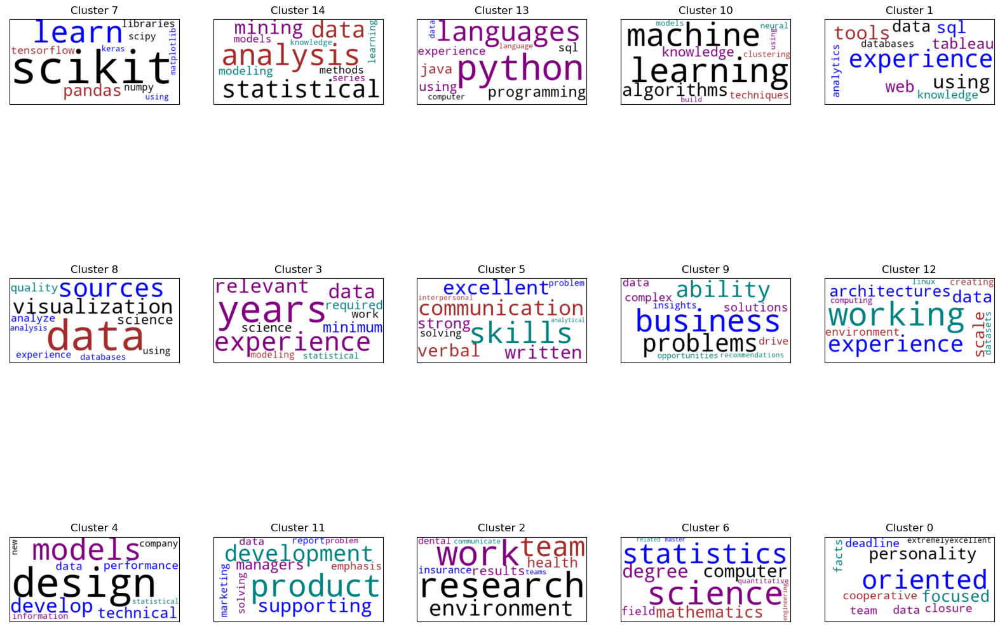

In [58]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=15)### K values is 20, it will present a list of panda table where
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 20.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=3, num_columns=5)###use 4x5 grid to present the clusters.
plt.show()

In [59]:
np.random.seed(1)
for cluster_id in [7]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)  ### print out the bullet texts of cluster 7.


Cluster 7:
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Experience with machine learning libraries and platforms, like Scikit-learn and Tensorflow
Proficiency in incorporating the use of external proprietary and open-source libraries such as, but not limited to, Pandas, Scikit- learn, Matplotlib, Seaborn, GDAL, GeoPandas, and ArcPy
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib


## K=20

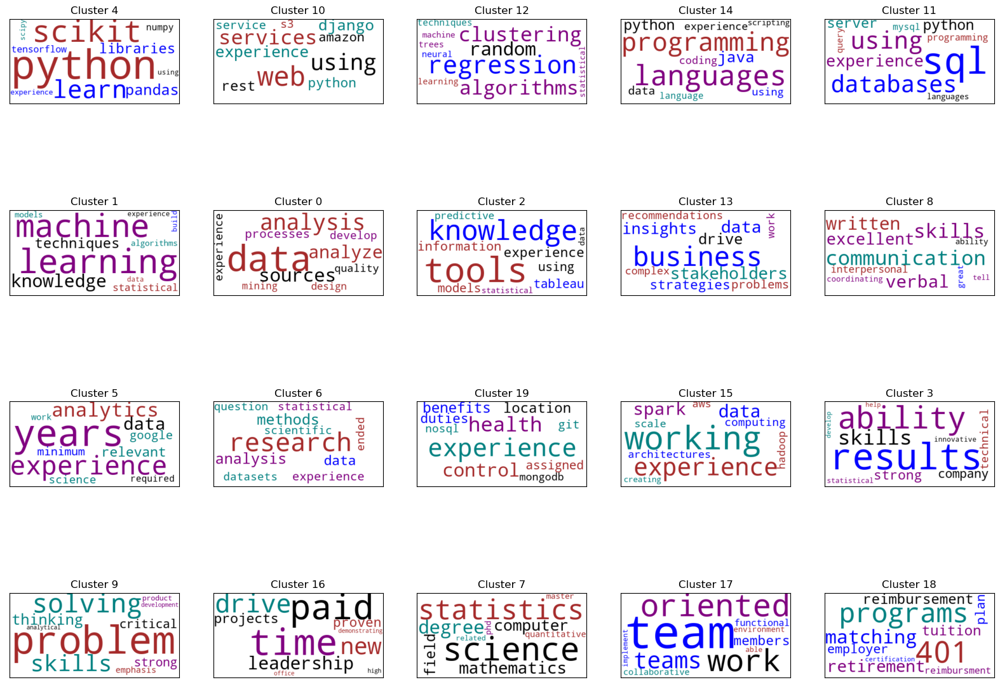

In [60]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=20)### K values is 20, it will present a list of panda table where
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 20.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=4, num_columns=5)###use 4x5 grid to present the clusters.
plt.show()

In [61]:
np.random.seed(1)
for cluster_id in [4]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)  ### print out the bullet texts of cluster 8 and 1.


Cluster 4:
Proficiency in R (e.g. ggplot2, cluster, dplyr, caret), Python (e.g. pandas, scikit-learn, bokeh, nltk), Spark – MLlib, H20, or other statistical tools.
Should be fluent in either Python or R. Hands-on experience with Python libraries like scikit-learn, numpy, scipy and pandas
Expert knowledge of machine learning libraries such as scikit-learn, TensorFlow, and keras
Proficient with using scripting language such as Python and data manipulation/analysis libraries such as Scikit-learn and Pandas for analyzing and modeling data
Hands on experience in Python


## K=25

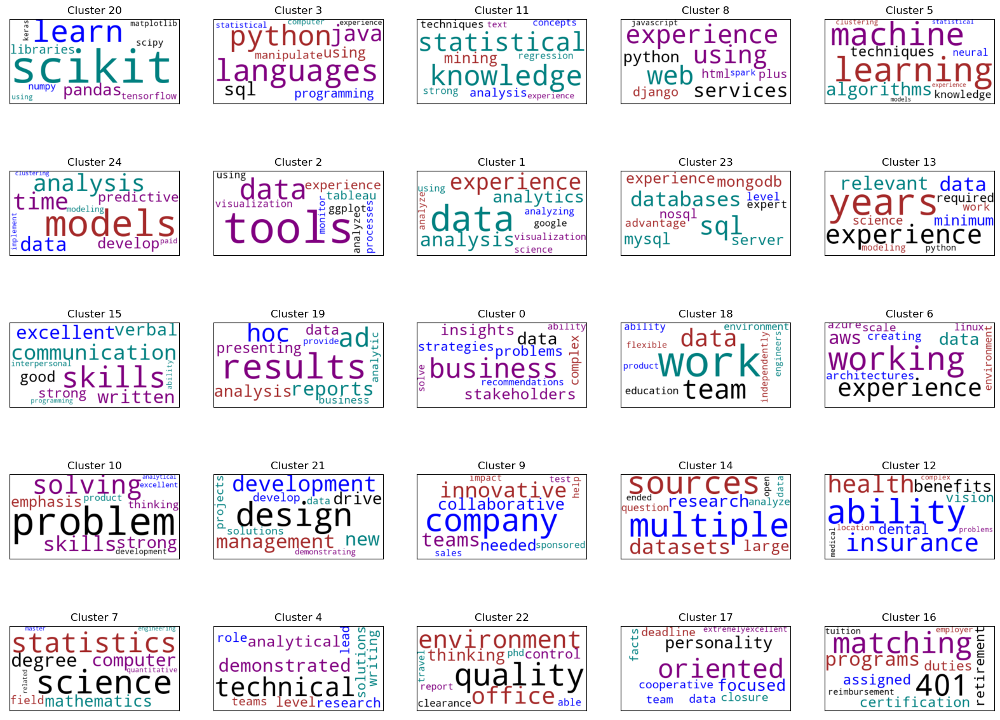

In [62]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=25)  ### K values is 25, it will present a list of panda table where 
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 25.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=5)### use 5x5 grid to present the clusters.
plt.show()

In [63]:
np.random.seed(1)
for cluster_id in [20]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)  ### print out the bullet texts of cluster 20.


Cluster 20:
Expert knowledge of machine learning libraries such as scikit-learn, TensorFlow, and keras
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
The following experiences are all considered an advantage, but not required:
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflowSolving problems using techniques including Regression, Support Vector Machines, Decision trees, random forest, Boosting, PCA, KMeansUsing SQL/No SQL databases is an advantageWorking in Linux and in a High Performance Computing environment
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow


## K=10

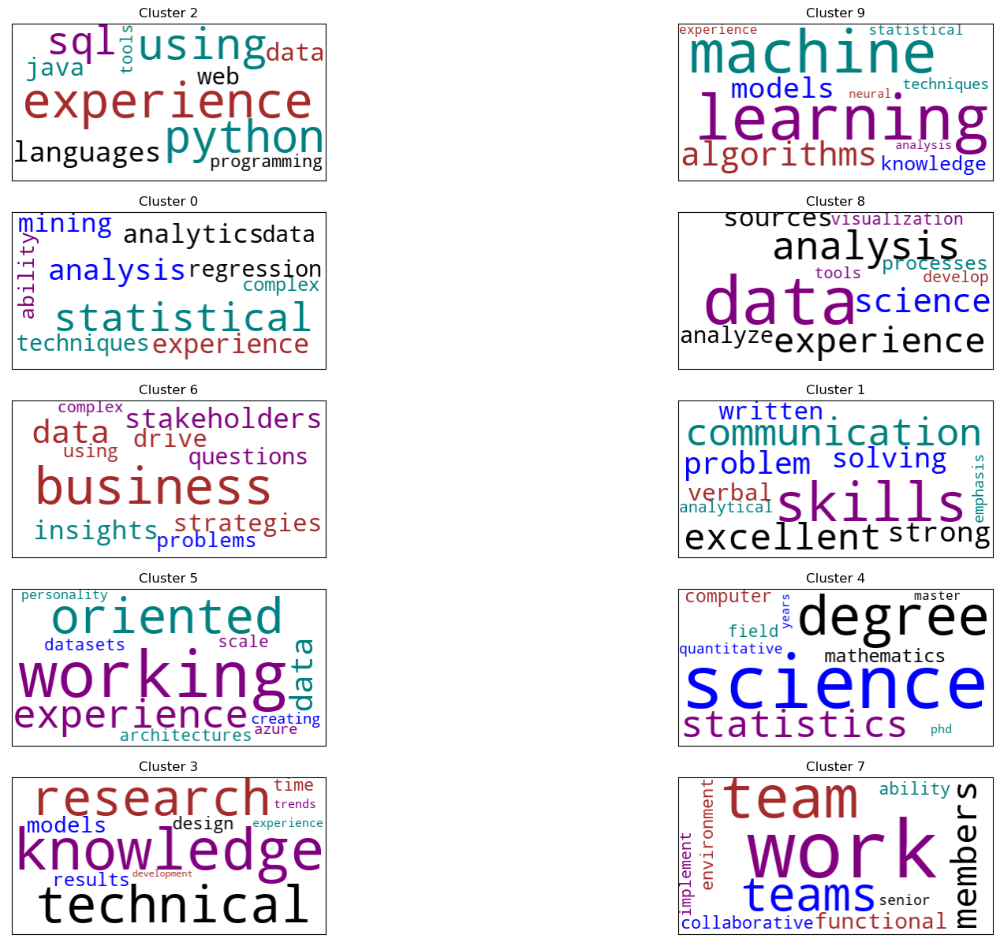

In [64]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=10)### K values is 10, it will present a list of panda table where
sorted_cluster_groups = sort_cluster_groups(cluster_groups)### each table present a cluster and total clusters is 10.
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=2)###use 5x2 grid to presents the clusters.
plt.show()

In [65]:
np.random.seed(1)
for cluster_id in [2]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)  ### print out the bullet texts of cluster 2.


Cluster 2:
Visualizing and communicating analytical results, using technologies such as HTML, JavaScript, D3, Tableau, and PowerBI
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Experience with version control tool like Git
Knowledge of deploying a model using pickling and deploying a web app via Django/Flask would be a plus
Proficiency in using query languages such as SQL, Hive, Pig, Sqoop


From the first sorted cluster in different k value in the 700 highest relevant job postings:<br>
**k=20**<br>
Cluster 17:<br>
Experience with toolkits such as TensorFlow, PyTorch, or Keras<br>
Experience in deep learning framework such as TensorFlow, PyTorch, CNTK, etc<br>
Expertise with statistical software packages like R, Python, MatLab, NumPy, SciPy, or SAS<br>
Proficiency in Python (scikit learn, pandas, numpy etc.) SAS, SQL, R & MATLAB, C/C++, Jupyter Notebook<br>
Experience with python analytical packages (eg. pandas, PySpark, statsmodels, scikit-learn, matplotlib, or similar)<br>

From the first sorted cluster in different k value in the 60 highest relevant job postings:<br>
**K=10**<br>
Cluster 2:<br>
Visualizing and communicating analytical results, using technologies such as HTML, JavaScript, D3, Tableau, and PowerBI<br>
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow<br>
Experience with version control tool like Git
Knowledge of deploying a model using pickling and deploying a web app via Django/Flask would be a plus
Proficiency in using query languages such as SQL, Hive, Pig, Sqoop<br>
**K=15**<br>
Cluster 7:<br>
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow<br>
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow<br>
Experience with machine learning libraries and platforms, like Scikit-learn and Tensorflow<br>
Proficiency in incorporating the use of external proprietary and open-source libraries such as, but not limited to, Pandas, Scikit- learn, Matplotlib, Seaborn, GDAL, GeoPandas, and ArcPy<br>
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib<br>
**K=20**<br>
Cluster 4:<br>
Proficiency in R (e.g. ggplot2, cluster, dplyr, caret), Python (e.g. pandas, scikit-learn, bokeh, nltk), Spark – MLlib, H20, or other statistical tools.<br>
Should be fluent in either Python or R. Hands-on experience with Python libraries like scikit-learn, numpy, scipy and pandas<br>
Expert knowledge of machine learning libraries such as scikit-learn, TensorFlow, and keras<br>
Proficient with using scripting language such as Python and data manipulation/analysis libraries such as Scikit-learn and Pandas for analyzing and modeling data<br>
Hands on experience in Python<br>
**K=25**<br>
Cluster 20:<br>
Expert knowledge of machine learning libraries such as scikit-learn, TensorFlow, and keras<br>
Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow<br>
The following experiences are all considered an advantage, but not required:<br>
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflowSolving problems using techniques including Regression, Support Vector Machines, Decision trees, random forest, Boosting, PCA, KMeansUsing SQL/No SQL databases is an advantageWorking in Linux and in a High Performance Computing environment<br>
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib<br>
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow<br>



## New Conclusion

From the five cluster bullets, firstly, it is important to show we are proficent in R and Python and mension that we are familiar with the software packages such as scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow if we know how to apply those software packages.<br>

Secondly,compared to the previous solution for only add "we are proficent in python", our new solution is "we are proficent in python expecially in Matplotlib,Numpy,Scipy,Scikit-Learn,jupyter,TensorFlow and Keras."

Thirdly, we can add " we are proficient in SAS,SQL,C++,Jupyter" if we know that computer language and those skills are meaninful for us to finding data science or statiscian job.
